In [4]:
# !rm -rf /content/results_mnist
# !rm -rf /content/results_cifar10

# 1- Ablations Study on CIFAR-10

100%|██████████| 9.91M/9.91M [00:02<00:00, 4.93MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 129kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.23MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 11.1MB/s]



Training with Full Helix...
Epoch 1/8, Loss: 0.5560, Test Acc: 97.35%, Time: 54.91s
Epoch 2/8, Loss: 0.0798, Test Acc: 98.06%, Time: 52.95s
Epoch 3/8, Loss: 0.0528, Test Acc: 98.85%, Time: 56.05s
Epoch 4/8, Loss: 0.0362, Test Acc: 99.03%, Time: 55.94s
Epoch 5/8, Loss: 0.0279, Test Acc: 98.65%, Time: 56.95s
Epoch 6/8, Loss: 0.0256, Test Acc: 99.16%, Time: 54.72s
Epoch 7/8, Loss: 0.0185, Test Acc: 98.85%, Time: 55.56s
Epoch 8/8, Loss: 0.0185, Test Acc: 99.12%, Time: 58.74s

Training with No Sign Momentum (φ=0)...
Epoch 1/8, Loss: 0.5424, Test Acc: 97.10%, Time: 56.76s
Epoch 2/8, Loss: 0.0856, Test Acc: 98.43%, Time: 53.55s
Epoch 3/8, Loss: 0.0543, Test Acc: 98.74%, Time: 56.01s
Epoch 4/8, Loss: 0.0389, Test Acc: 98.73%, Time: 54.37s
Epoch 5/8, Loss: 0.0310, Test Acc: 98.79%, Time: 55.83s
Epoch 6/8, Loss: 0.0267, Test Acc: 99.25%, Time: 56.05s
Epoch 7/8, Loss: 0.0206, Test Acc: 99.09%, Time: 56.35s
Epoch 8/8, Loss: 0.0188, Test Acc: 99.07%, Time: 56.50s

Training with Fixed Phi (φ=0.05).

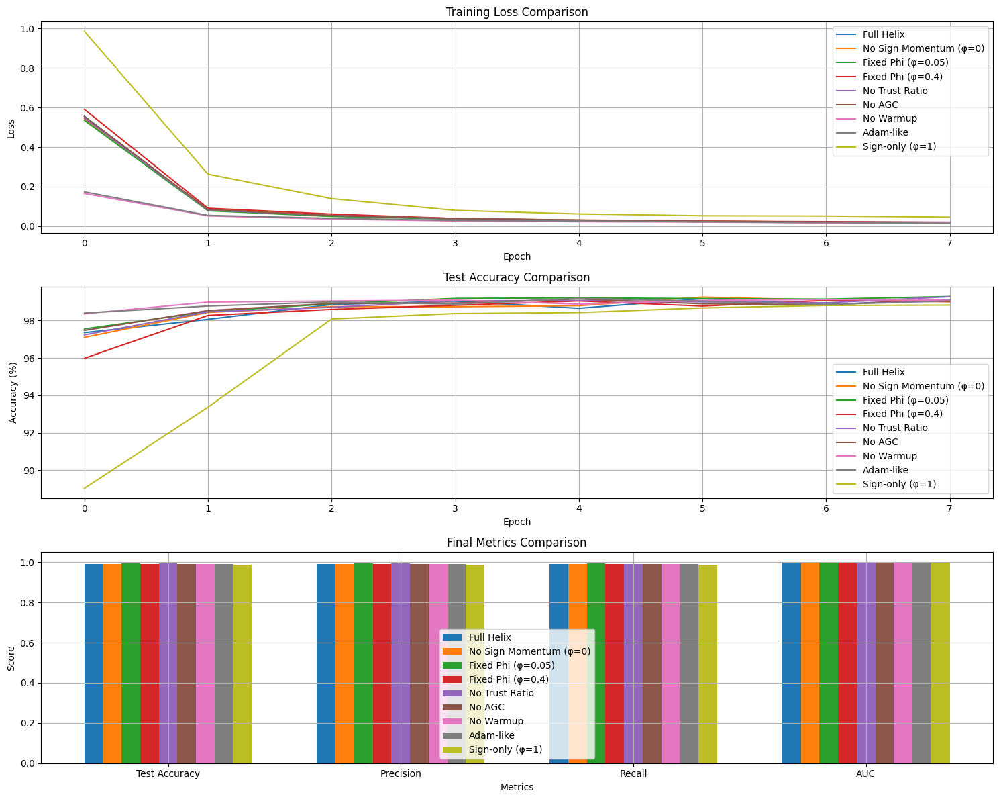


Results saved to /content/results_mnist/run_8epochs
- Plot: /content/results_mnist/run_8epochs/mnist_ablation_study_results_8epochs.png
- CSV: /content/results_mnist/run_8epochs/mnist_ablation_results_8epochs.csv
- Config: /content/results_mnist/run_8epochs/config.txt

Successfully created /content/results_mnist.zip

To download the results in Google Colab:
1. Run the following code in a new cell:
```python
from google.colab import files
files.download('/content/results_mnist.zip')
```
2. Or use the file browser on the left side of Colab to download the file directly.


In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import time
import os
from torch.optim import Optimizer
import math
from sklearn.metrics import roc_auc_score, precision_score, recall_score, accuracy_score
from sklearn.preprocessing import label_binarize
import csv

# ======================
# CONFIGURATION SECTION
# ======================
# Control all parameters from this section
config = {
    'epochs': 8,           # Number of training epochs
    'batch_size': 128,      # Batch size for data loaders
    'num_workers': 2,       # Number of workers for data loading
    'learning_rate': 1e-3,  # Learning rate for optimizers
    'save_results': True,   # Whether to save results to files
    'random_seed': 42,      # Random seed for reproducibility
    'model_dropout': 0.2,   # Dropout rate in the model
    'weight_decay': 1e-2,   # Weight decay for optimizers
    'results_dir': '/content/results_mnist',  # Directory to save results (Colab path)
}

# Create results directory if it doesn't exist
if config['save_results'] and not os.path.exists(config['results_dir']):
    os.makedirs(config['results_dir'])

# Set random seeds
torch.manual_seed(config['random_seed'])
np.random.seed(config['random_seed'])

# Define small parameter threshold for trust ratio and AGC
SMALL_PARAM_THRESHOLD = 128

# ---------------------------
# Helix Optimizer Implementation
# ---------------------------
class Helix(Optimizer):
    def __init__(self, params, lr=None, betas=(0.9, 0.999), beta_s=0.9,
                 eps=1e-8, weight_decay=None, agc=False,
                 phi_init=0.05, phi_final=0.4, phi_warmup=10000,
                 warmup_steps=1000, use_trust_ratio=False,
                 kappa=1.0, agc_clip=0.05):
        # Use config values if not provided
        if lr is None:
            lr = config['learning_rate']
        if weight_decay is None:
            weight_decay = config['weight_decay']

        defaults = dict(lr=lr, betas=betas, beta_s=beta_s, eps=eps,
                        weight_decay=weight_decay, agc=agc,
                        phi_init=phi_init, phi_final=phi_final,
                        phi_warmup=phi_warmup, warmup_steps=warmup_steps,
                        use_trust_ratio=use_trust_ratio, kappa=kappa,
                        agc_clip=agc_clip)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr = group['lr']
            beta1, beta2 = group['betas']
            beta_s = group['beta_s']
            eps = group['eps']
            wd = group['weight_decay']
            phi_init = group['phi_init']
            phi_final = group['phi_final']
            phi_warmup = group['phi_warmup']
            warmup_steps = group['warmup_steps']
            use_trust = group['use_trust_ratio']
            kappa = group['kappa']
            agc_clip = group['agc_clip']
            use_agc = group['agc']

            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad
                if grad.is_sparse:
                    raise RuntimeError("Helix does not support sparse gradients")

                is_weight_like = (p.ndim > 1) and (p.numel() >= SMALL_PARAM_THRESHOLD)

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['b'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['s'] = torch.zeros_like(p, memory_format=torch.preserve_format)

                state['step'] += 1
                step = state['step']

                if (use_agc or use_trust) and is_weight_like:
                    param_norm = torch.linalg.vector_norm(p).clamp(min=eps)
                else:
                    param_norm = None

                if use_agc and is_weight_like:
                    grad_norm = torch.linalg.vector_norm(grad)
                    max_norm = agc_clip * param_norm
                    if grad_norm > max_norm:
                        grad.mul_(max_norm / (grad_norm + 1e-6))

                m = state['m']
                b = state['b']
                s = state['s']

                m.mul_(beta1).add_(grad, alpha=1.0 - beta1)
                diff = grad - m
                b.mul_(beta2).addcmul_(diff, diff, value=1.0 - beta2)

                bias_correction1 = 1.0 - beta1 ** step
                bias_correction2 = 1.0 - beta2 ** step
                m_hat = m / (bias_correction1 + 1e-16)
                b_hat = b / (bias_correction2 + 1e-16)
                d = b_hat.sqrt().add_(eps)

                s.mul_(beta_s).add_(m_hat.sign(), alpha=1.0 - beta_s)

                if step <= phi_warmup:
                    phi = phi_init + (phi_final - phi_init) * (step / max(1, phi_warmup))
                else:
                    phi = phi_final

                u_adapt = m_hat / d
                u_sign = s.clamp(-1.0, 1.0)
                delta = -((1.0 - phi) * u_adapt + phi * (kappa * u_sign))

                lr_t = lr * (step / max(1, warmup_steps)) if step <= warmup_steps else lr

                if use_trust and is_weight_like:
                    delta_norm = torch.linalg.vector_norm(delta)
                    if delta_norm > 0:
                        trust = (param_norm / (delta_norm + 1e-6)).clamp(0.01, 10.0)
                        delta.mul_(trust)

                p.add_(delta, alpha=lr_t)

                if wd != 0:
                    p.mul_(1.0 - lr_t * wd)

        return loss

# ---------------------------
# Ablation Variants of Helix
# ---------------------------
class Helix_NSM(Helix):  # No Sign Momentum (φ=0)
    def __init__(self, params, **kwargs):
        super().__init__(params, phi_init=0.0, phi_final=0.0, **kwargs)

class Helix_FP_05(Helix):  # Fixed Phi (φ=0.05)
    def __init__(self, params, **kwargs):
        super().__init__(params, phi_init=0.05, phi_final=0.05, **kwargs)

class Helix_FP_40(Helix):  # Fixed Phi (φ=0.4)
    def __init__(self, params, **kwargs):
        super().__init__(params, phi_init=0.4, phi_final=0.4, **kwargs)

class Helix_NTR(Helix):  # No Trust Ratio
    def __init__(self, params, **kwargs):
        super().__init__(params, use_trust_ratio=False, **kwargs)

class Helix_NAGC(Helix):  # No AGC
    def __init__(self, params, **kwargs):
        super().__init__(params, agc=False, **kwargs)

class Helix_NW(Helix):  # No Warmup
    def __init__(self, params, **kwargs):
        super().__init__(params, warmup_steps=0, **kwargs)

class Helix_AdamLike(Helix):  # Adam-like (φ=0, no trust, no AGC, no warmup)
    def __init__(self, params, **kwargs):
        super().__init__(params, phi_init=0.0, phi_final=0.0,
                         use_trust_ratio=False, agc=False, warmup_steps=0, **kwargs)

class Helix_SO(Helix):  # Sign-only (φ=1)
    def __init__(self, params, **kwargs):
        super().__init__(params, phi_init=1.0, phi_final=1.0, **kwargs)

# ---------------------------
# Model Definition (Simple CNN for MNIST)
# ---------------------------
class MNIST_CNN(nn.Module):
    def __init__(self, dropout_rate=None):
        super(MNIST_CNN, self).__init__()
        # Use config dropout rate if not provided
        if dropout_rate is None:
            dropout_rate = config['model_dropout']

        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.fc2 = nn.Linear(128, 10)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)

    def forward(self, x):
        x = self.pool(self.relu(self.conv1(x)))
        x = self.pool(self.relu(self.conv2(x)))
        x = x.view(-1, 64 * 7 * 7)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

# ---------------------------
# Data Loading Function
# ---------------------------
def get_mnist_dataloaders():
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
    ])

    trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                          download=True, transform=transform)
    trainloader = torch.utils.data.DataLoader(trainset, batch_size=config['batch_size'],
                                              shuffle=True, num_workers=config['num_workers'])

    testset = torchvision.datasets.MNIST(root='./data', train=False,
                                         download=True, transform=transform)
    testloader = torch.utils.data.DataLoader(testset, batch_size=config['batch_size'],
                                             shuffle=False, num_workers=config['num_workers'])
    return trainloader, testloader

# ---------------------------
# Training Function with Metrics
# ---------------------------
def train_model(optimizer_class, model, trainloader, testloader):
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_class(model.parameters())

    train_losses = []
    test_accuracies = []
    epoch_times = []

    # For final metrics
    all_labels = []
    all_preds = []
    all_probs = []

    for epoch in range(config['epochs']):
        model.train()
        running_loss = 0.0
        start_time = time.time()

        for i, (inputs, labels) in enumerate(trainloader, 0):
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        epoch_time = time.time() - start_time
        epoch_times.append(epoch_time)

        # Evaluate on test set
        model.eval()
        correct = 0
        total = 0
        epoch_labels = []
        epoch_preds = []
        epoch_probs = []

        with torch.no_grad():
            for inputs, labels in testloader:
                outputs = model(inputs)
                probs = torch.softmax(outputs, dim=1)
                _, predicted = torch.max(outputs.data, 1)

                total += labels.size(0)
                correct += (predicted == labels).sum().item()

                epoch_labels.extend(labels.cpu().numpy())
                epoch_preds.extend(predicted.cpu().numpy())
                epoch_probs.extend(probs.cpu().numpy())

        epoch_loss = running_loss / len(trainloader)
        epoch_acc = 100 * correct / total

        train_losses.append(epoch_loss)
        test_accuracies.append(epoch_acc)

        # Store for final metrics
        all_labels = epoch_labels
        all_preds = epoch_preds
        all_probs = epoch_probs

        print(f'Epoch {epoch+1}/{config["epochs"]}, Loss: {epoch_loss:.4f}, Test Acc: {epoch_acc:.2f}%, Time: {epoch_time:.2f}s')

    # Calculate final metrics
    test_accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    # Calculate AUC (one-vs-rest for multi-class)
    n_classes = 10
    labels_bin = label_binarize(all_labels, classes=list(range(n_classes)))
    probs_array = np.array(all_probs)

    if n_classes == 2:
        auc = roc_auc_score(labels_bin, probs_array[:, 1])
    else:
        auc = roc_auc_score(labels_bin, probs_array, multi_class='ovr', average='macro')

    avg_epoch_time = np.mean(epoch_times)

    return {
        'train_losses': train_losses,
        'test_accuracies': test_accuracies,
        'test_accuracy': test_accuracy,
        'precision': precision,
        'recall': recall,
        'auc': auc,
        'avg_epoch_time': avg_epoch_time,
        'total_time': sum(epoch_times)
    }

# ---------------------------
# Ablation Study Function
# ---------------------------
def run_ablation_study():
    # Get data loaders
    trainloader, testloader = get_mnist_dataloaders()

    # Define optimizers
    optimizers = {
        'Full Helix': Helix,
        'No Sign Momentum (φ=0)': Helix_NSM,
        'Fixed Phi (φ=0.05)': Helix_FP_05,
        'Fixed Phi (φ=0.4)': Helix_FP_40,
        'No Trust Ratio': Helix_NTR,
        'No AGC': Helix_NAGC,
        'No Warmup': Helix_NW,
        'Adam-like': Helix_AdamLike,
        'Sign-only (φ=1)': Helix_SO
    }

    results = {}

    for name, opt_class in optimizers.items():
        print(f"\n{'='*50}")
        print(f"Training with {name}...")
        print(f"{'='*50}")
        model = MNIST_CNN()
        metrics = train_model(opt_class, model, trainloader, testloader)
        results[name] = metrics

    # Print results table
    print("\n" + "="*100)
    print(f"Ablation Study Results on MNIST ({config['epochs']} epochs)")
    print("="*100)
    print(f"{'Optimizer':<25} {'Test Acc':<10} {'Precision':<10} {'Recall':<10} {'AUC':<10} {'Avg Time':<12} {'Total Time':<12}")
    print("-"*100)

    for name, data in results.items():
        print(f"{name:<25} {data['test_accuracy']:<10.4f} {data['precision']:<10.4f} "
              f"{data['recall']:<10.4f} {data['auc']:<10.4f} {data['avg_epoch_time']:<12.2f}s "
              f"{data['total_time']:<12.2f}s")

    if config['save_results']:
        # Create subdirectory for this specific run
        run_dir = os.path.join(config['results_dir'], f"run_{config['epochs']}epochs")
        if not os.path.exists(run_dir):
            os.makedirs(run_dir)

        # Visualization
        plt.figure(figsize=(15, 12))

        # Plot training loss
        plt.subplot(3, 1, 1)
        for name, data in results.items():
            plt.plot(data['train_losses'], label=name)
        plt.title('Training Loss Comparison')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)

        # Plot test accuracy
        plt.subplot(3, 1, 2)
        for name, data in results.items():
            plt.plot(data['test_accuracies'], label=name)
        plt.title('Test Accuracy Comparison')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy (%)')
        plt.legend()
        plt.grid(True)

        # Plot metrics comparison
        plt.subplot(3, 1, 3)
        metrics_names = ['Test Accuracy', 'Precision', 'Recall', 'AUC']
        x = np.arange(len(metrics_names))
        width = 0.08

        for i, (name, data) in enumerate(results.items()):
            values = [data['test_accuracy'], data['precision'], data['recall'], data['auc']]
            plt.bar(x + i*width, values, width, label=name)

        plt.title('Final Metrics Comparison')
        plt.xlabel('Metrics')
        plt.ylabel('Score')
        plt.xticks(x + width*4, metrics_names)
        plt.legend()
        plt.grid(True)

        plt.tight_layout()

        # Save the plot
        plot_path = os.path.join(run_dir, f'mnist_ablation_study_results_{config["epochs"]}epochs.png')
        plt.savefig(plot_path)
        plt.show()

        # Save results to CSV
        csv_path = os.path.join(run_dir, f'mnist_ablation_results_{config["epochs"]}epochs.csv')
        with open(csv_path, 'w', newline='') as csvfile:
            fieldnames = ['Optimizer', 'Test Accuracy', 'Precision', 'Recall', 'AUC',
                          'Avg Epoch Time (s)', 'Total Time (s)']
            writer = csv.DictWriter(csvfile, fieldnames=fieldnames)

            writer.writeheader()
            for name, data in results.items():
                writer.writerow({
                    'Optimizer': name,
                    'Test Accuracy': data['test_accuracy'],
                    'Precision': data['precision'],
                    'Recall': data['recall'],
                    'AUC': data['auc'],
                    'Avg Epoch Time (s)': data['avg_epoch_time'],
                    'Total Time (s)': data['total_time']
                })

        # Save configuration file
        config_path = os.path.join(run_dir, 'config.txt')
        with open(config_path, 'w') as f:
            for key, value in config.items():
                f.write(f"{key}: {value}\n")

        print(f"\nResults saved to {run_dir}")
        print(f"- Plot: {plot_path}")
        print(f"- CSV: {csv_path}")
        print(f"- Config: {config_path}")

    return results

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    # Run the ablation study with configuration from the top
    results = run_ablation_study()

    # Create a zip file of the results directory
    if config['save_results']:
        import zipfile

        # Define the directory to zip
        results_dir = config['results_dir']
        # Define the name for the zip file
        zip_filename = f"{results_dir}.zip"

        # Create a ZipFile object
        if os.path.exists(results_dir):
            with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
                # Walk through the directory and add files to the zip
                for root, _, files_in_dir in os.walk(results_dir):
                    for file in files_in_dir:
                        file_path = os.path.join(root, file)
                        # Add file to zip, preserving directory structure
                        zipf.write(file_path, os.path.relpath(file_path, results_dir))
            print(f"\nSuccessfully created {zip_filename}")

            # For Google Colab: provide download instructions
            print("\nTo download the results in Google Colab:")
            print("1. Run the following code in a new cell:")
            print("```python")
            print("from google.colab import files")
            print("files.download('/content/results_mnist.zip')")
            print("```")
            print("2. Or use the file browser on the left side of Colab to download the file directly.")
        else:
            print(f"Error: Directory '{results_dir}' not found.")

In [2]:
from google.colab import files
import os

# Define the zip file path
zip_filename = "/content/results_mnist.zip"

# Check if the file exists and download it
if os.path.exists(zip_filename):
    files.download(zip_filename)
else:
    print(f"Error: File '{zip_filename}' not found.")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 2- MNIST

Setting random seed for reproducibility...


100%|██████████| 9.91M/9.91M [00:00<00:00, 18.7MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 554kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 4.60MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 14.0MB/s]


Training Helix on MNIST for 10 epochs on cuda...
Epoch 1/10 | Train Loss: 0.4893, Acc: 0.8426 | Val Loss: 0.0965, Acc: 0.9712 | Time: 14.12s
Epoch 2/10 | Train Loss: 0.0888, Acc: 0.9734 | Val Loss: 0.0745, Acc: 0.9785 | Time: 12.86s
Epoch 3/10 | Train Loss: 0.0777, Acc: 0.9782 | Val Loss: 0.0770, Acc: 0.9802 | Time: 12.71s
Epoch 4/10 | Train Loss: 0.0601, Acc: 0.9834 | Val Loss: 0.0641, Acc: 0.9807 | Time: 12.57s
Epoch 5/10 | Train Loss: 0.0424, Acc: 0.9883 | Val Loss: 0.0715, Acc: 0.9858 | Time: 12.61s
Epoch 6/10 | Train Loss: 0.0324, Acc: 0.9912 | Val Loss: 0.0614, Acc: 0.9865 | Time: 12.44s
Epoch 7/10 | Train Loss: 0.0247, Acc: 0.9936 | Val Loss: 0.0557, Acc: 0.9875 | Time: 12.63s
Epoch 8/10 | Train Loss: 0.0142, Acc: 0.9961 | Val Loss: 0.0679, Acc: 0.9888 | Time: 12.80s
Epoch 9/10 | Train Loss: 0.0066, Acc: 0.9980 | Val Loss: 0.0599, Acc: 0.9900 | Time: 12.68s
Epoch 10/10 | Train Loss: 0.0023, Acc: 0.9994 | Val Loss: 0.0692, Acc: 0.9915 | Time: 12.67s

Final Test Results for Helix:

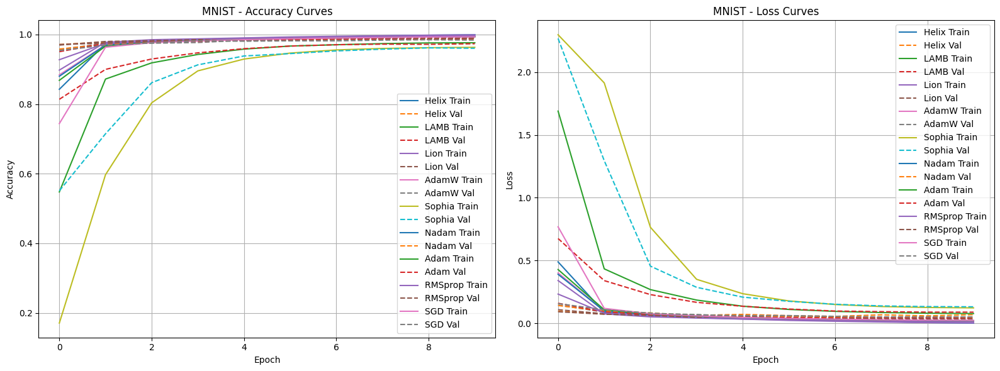

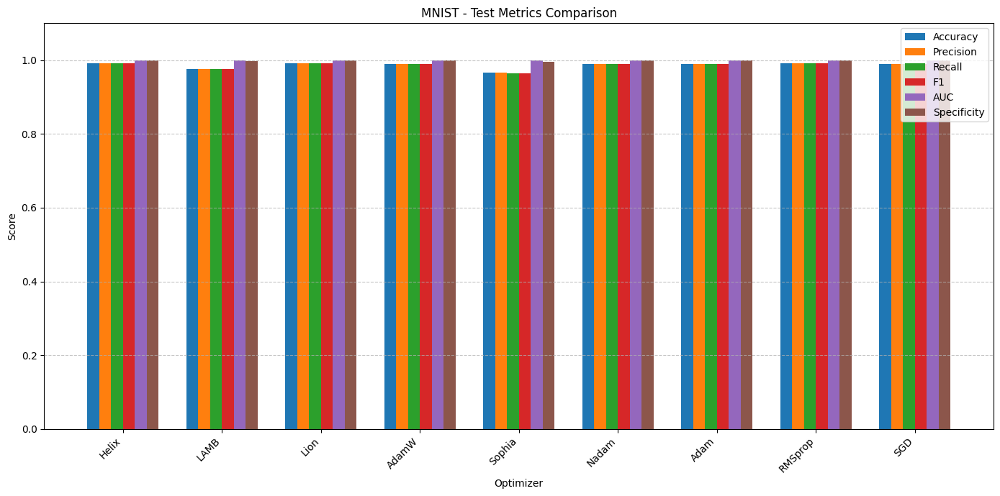

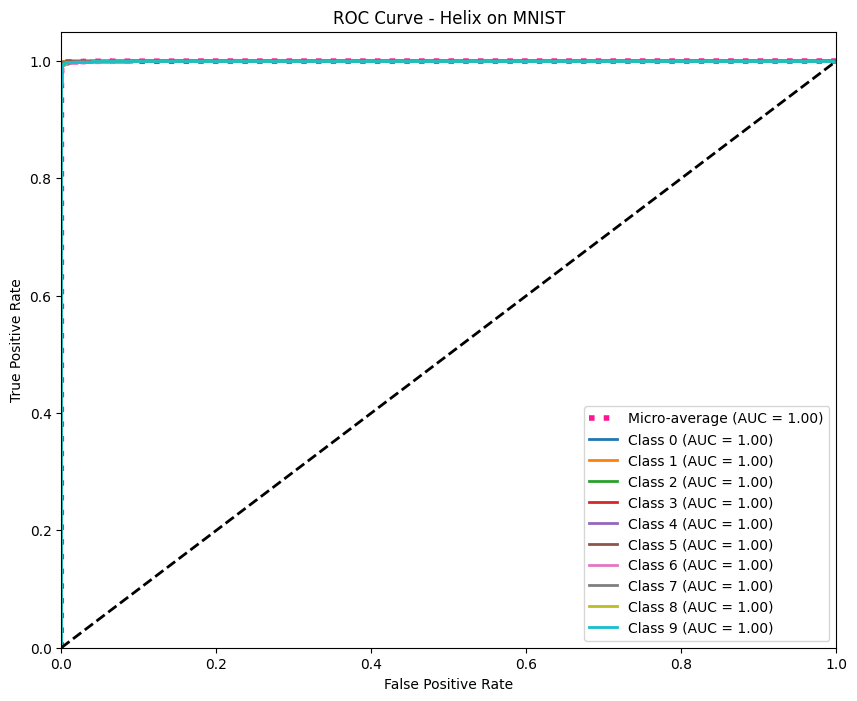

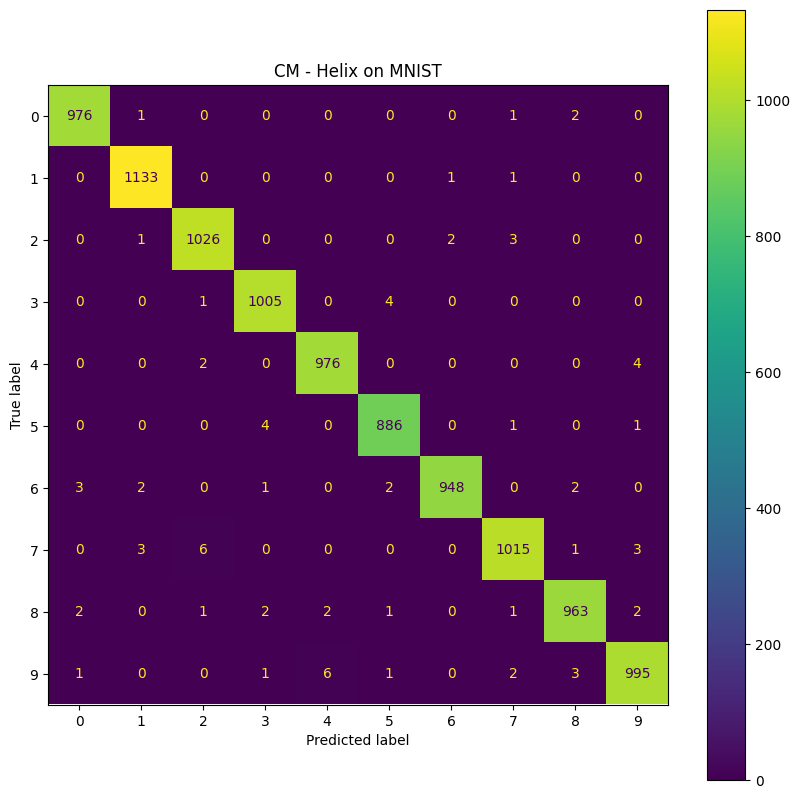

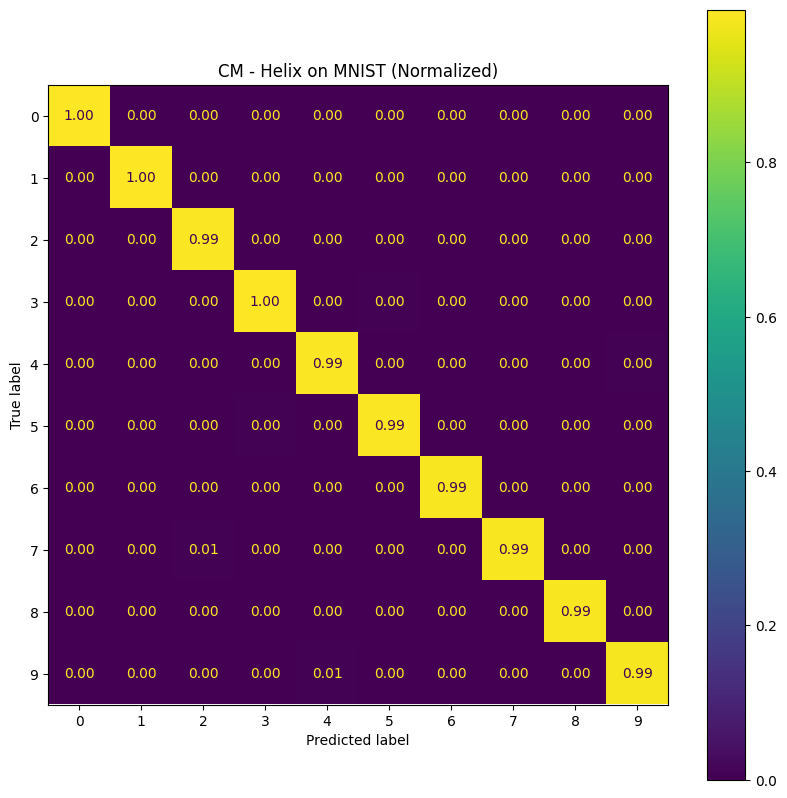

...

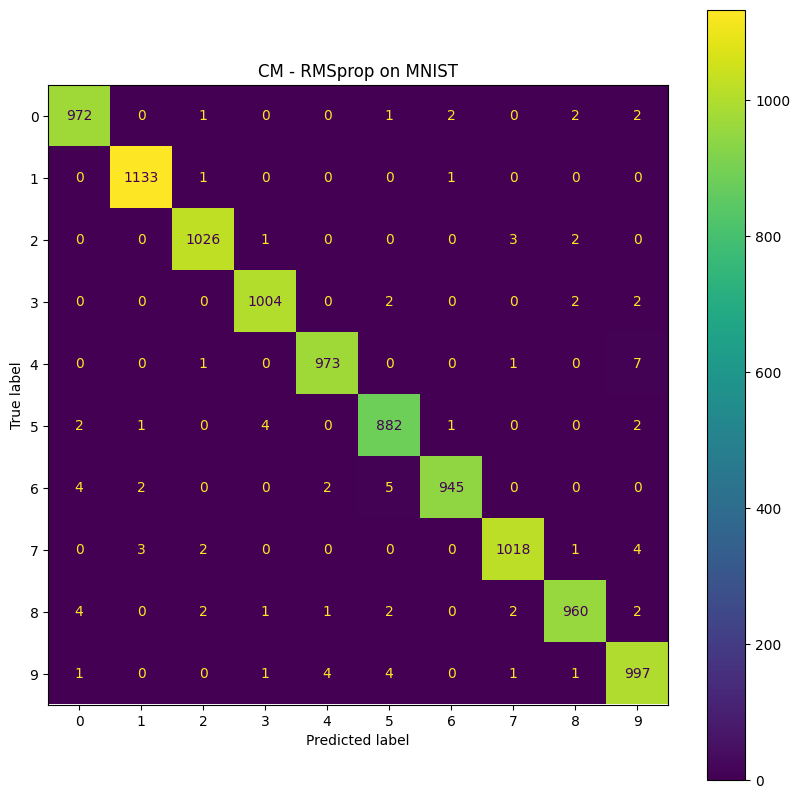

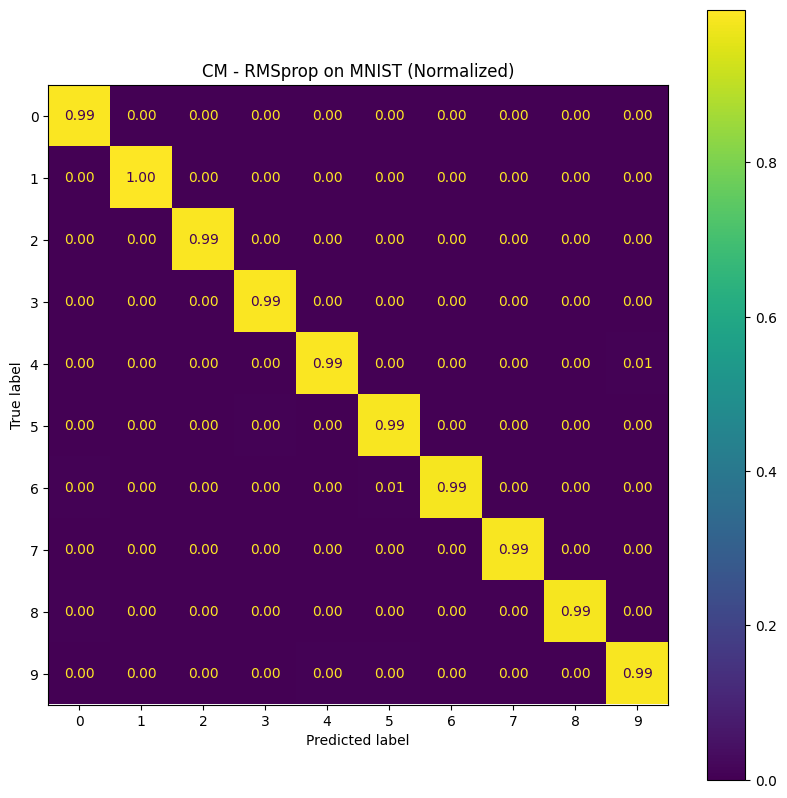

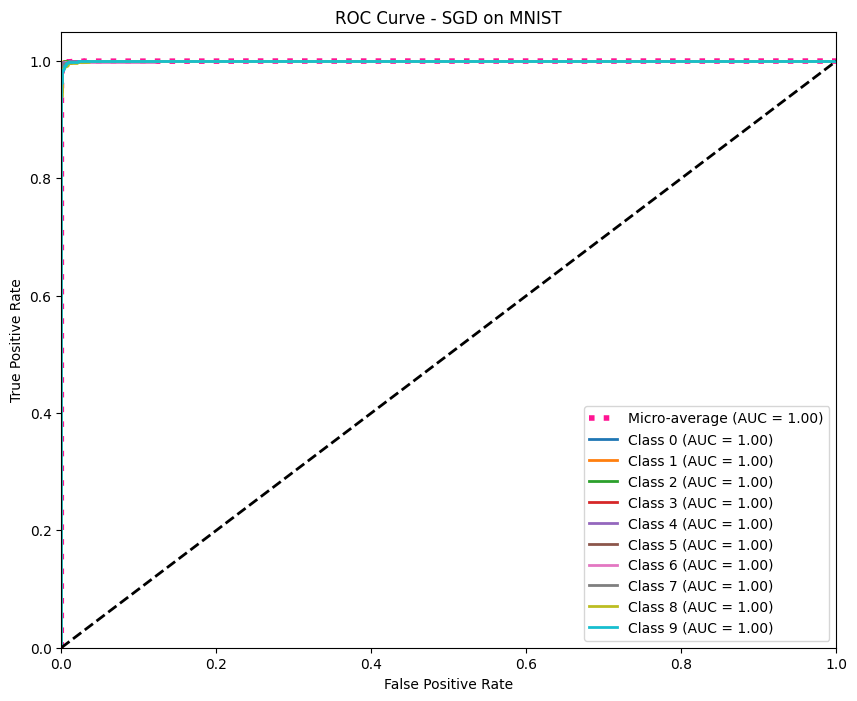

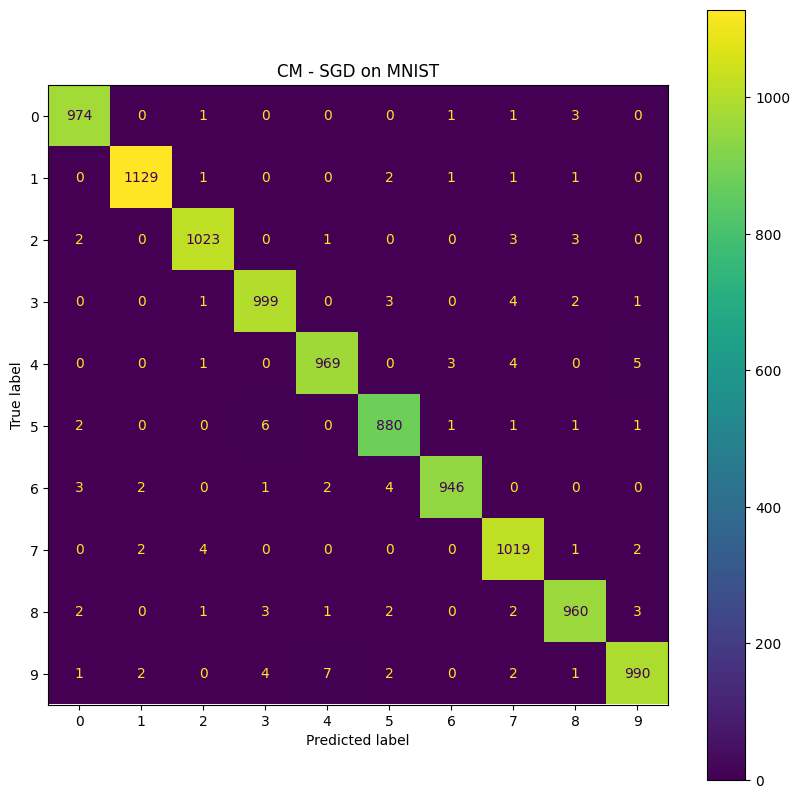

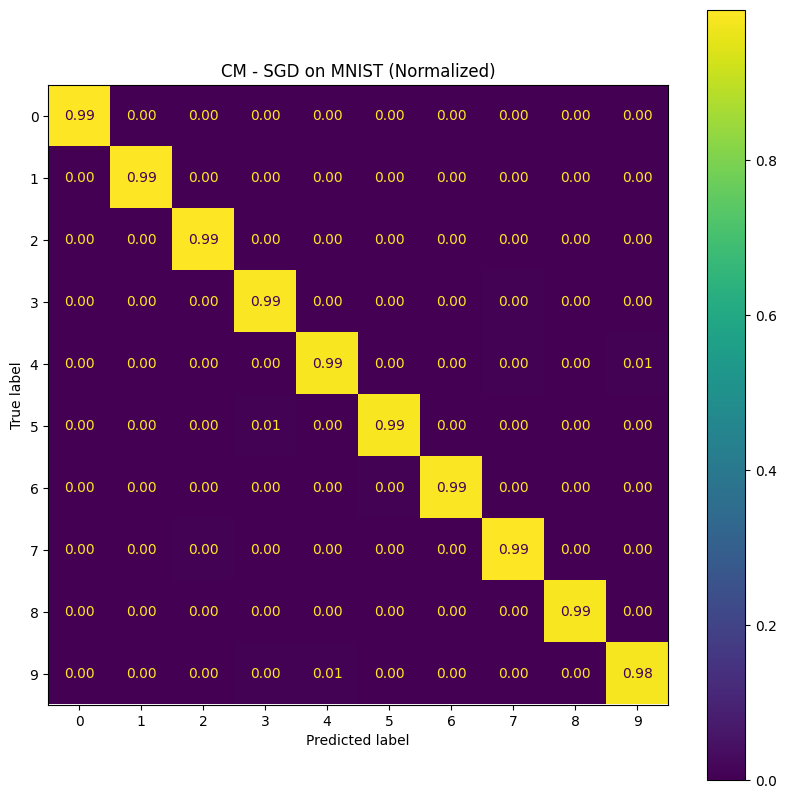


=== LaTeX Table for MNIST ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Helix & 0.0508 & 0.9923 & 0.9923 & 0.9922 & 0.9923 & 0.9999 & 0.9991 & 12.99 \\
LAMB & 0.0763 & 0.9755 & 0.9754 & 0.9753 & 0.9754 & 0.9996 & 0.9973 & 13.30 \\
Lion & 0.0452 & 0.9909 & 0.9908 & 0.9907 & 0.9907 & 0.9999 & 0.9990 & 12.02 \\
AdamW & 0.0311 & 0.9899 & 0.9898 & 0.9898 & 0.9898 & 0.9999 & 0.9989 & 11.81 \\
Sophia & 0.1104 & 0.9654 & 0.9653 & 0.9652 & 0.9652 & 0.9991 & 0.9962 & 12.10 \\
Nadam & 0.0312 & 0.9901 & 0.9900 & 0.9900 & 0.9900 & 0.9999 & 0.9989 & 12.00 \\
Adam & 0.0297 & 0.9892 & 0.9891 & 0.9891 & 0.9891 & 0.9999 & 0.9988 & 11.81 \\
RMSprop & 0.0274 & 0.9910 & 0.9909 & 0.9908 & 0.9909 & 0.9999 & 0.9990 & 12.27 \\
SGD & 0.0355 & 0.9889 & 0.9888 & 0.9888 & 0.9888 & 0.9999 & 0.9988 & 12.06 \\
\bottomrule
\end{tabular}
\caption{Performance Metrics for MNIST}
\label{ta

In [ ]:
import os
import random
import time
from collections import Counter
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()

# Global settings
NUM_EPOCHS = 10
RESULTS_DIR = "results_mnist"
os.makedirs(RESULTS_DIR, exist_ok=True)
SMALL_PARAM_THRESHOLD = 1024  # skip AGC/trust for tiny tensors to save norms

# ---------------------------
# Optimizer Implementations
# ---------------------------

import torch
import torch.optim as optim
from torch.optim import Optimizer
import math

# ---------------------------
# Helix Optimizer
# ---------------------------
class Helix(Optimizer):
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), beta_s=0.9,
                 eps=1e-8, weight_decay=1e-2, agc=False,
                 phi_init=0.05, phi_final=0.4, phi_warmup=10000,
                 warmup_steps=1000, use_trust_ratio=False,
                 kappa=1.0, agc_clip=0.05):
        defaults = dict(lr=lr, betas=betas, beta_s=beta_s, eps=eps,
                        weight_decay=weight_decay, agc=agc,
                        phi_init=phi_init, phi_final=phi_final,
                        phi_warmup=phi_warmup, warmup_steps=warmup_steps,
                        use_trust_ratio=use_trust_ratio, kappa=kappa,
                        agc_clip=agc_clip)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr = group['lr']
            beta1, beta2 = group['betas']
            beta_s = group['beta_s']
            eps = group['eps']
            wd = group['weight_decay']
            phi_init = group['phi_init']
            phi_final = group['phi_final']
            phi_warmup = group['phi_warmup']
            warmup_steps = group['warmup_steps']
            use_trust = group['use_trust_ratio']
            kappa = group['kappa']
            agc_clip = group['agc_clip']
            use_agc = group['agc']

            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad
                if grad.is_sparse:
                    raise RuntimeError("Helix does not support sparse gradients")

                is_weight_like = (p.ndim > 1) and (p.numel() >= SMALL_PARAM_THRESHOLD)

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['b'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['s'] = torch.zeros_like(p, memory_format=torch.preserve_format)

                state['step'] += 1
                step = state['step']

                if (use_agc or use_trust) and is_weight_like:
                    param_norm = torch.linalg.vector_norm(p).clamp(min=eps)
                else:
                    param_norm = None

                if use_agc and is_weight_like:
                    grad_norm = torch.linalg.vector_norm(grad)
                    max_norm = agc_clip * param_norm
                    if grad_norm > max_norm:
                        grad.mul_(max_norm / (grad_norm + 1e-6))

                m = state['m']
                b = state['b']
                s = state['s']

                m.mul_(beta1).add_(grad, alpha=1.0 - beta1)
                diff = grad - m
                b.mul_(beta2).addcmul_(diff, diff, value=1.0 - beta2)

                bias_correction1 = 1.0 - beta1 ** step
                bias_correction2 = 1.0 - beta2 ** step
                m_hat = m / (bias_correction1 + 1e-16)
                b_hat = b / (bias_correction2 + 1e-16)
                d = b_hat.sqrt().add_(eps)

                s.mul_(beta_s).add_(m_hat.sign(), alpha=1.0 - beta_s)

                if step <= phi_warmup:
                    phi = phi_init + (phi_final - phi_init) * (step / max(1, phi_warmup))
                else:
                    phi = phi_final

                u_adapt = m_hat / d
                u_sign = s.clamp(-1.0, 1.0)
                delta = -((1.0 - phi) * u_adapt + phi * (kappa * u_sign))

                lr_t = lr * (step / max(1, warmup_steps)) if step <= warmup_steps else lr

                if use_trust and is_weight_like:
                    delta_norm = torch.linalg.vector_norm(delta)
                    if delta_norm > 0:
                        trust = (param_norm / (delta_norm + 1e-6)).clamp(0.01, 10.0)
                        delta.mul_(trust)

                p.add_(delta, alpha=lr_t)

                if wd != 0:
                    p.mul_(1.0 - lr_t * wd)

        return loss




class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for MNIST
# ---------------------------
class LeNet5(nn.Module):
    """A simple LeNet-5 style CNN for MNIST classification."""
    def __init__(self):
        super(LeNet5, self).__init__()
        self.network = nn.Sequential(
            nn.Conv2d(1, 6, kernel_size=5, padding=2), # 28x28 -> 28x28
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 28x28 -> 14x14
            nn.Conv2d(6, 16, kernel_size=5), # 14x14 -> 10x10
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 10x10 -> 5x5
            nn.Flatten(),
            nn.Linear(16 * 5 * 5, 120),
            nn.ReLU(),
            nn.Linear(120, 84),
            nn.ReLU(),
            nn.Linear(84, 10)
        )
    def forward(self, x):
        return self.network(x)

def get_mnist_loaders(batch_size=128, data_root="./data"):
    """Creates and returns MNIST DataLoaders."""
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
    ])
    train_dataset = datasets.MNIST(root=data_root, train=True, download=True, transform=transform)
    test_dataset = datasets.MNIST(root=data_root, train=False, download=True, transform=transform)

    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    return train_loader, val_loader, test_loader

# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="MNIST", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizer Registry # Manual configuration
# ---------------------------
optimizers = {    'Helix': lambda params: Helix(params,
                 lr=1e-2,
                 betas=(0.9, 0.99),
                 beta_s=0.99,
                 eps=1e-8,
                 weight_decay=1e-2,
                 agc=False,
                 phi_init=0.05,
                 phi_final=0.4,
                 phi_warmup=10000,
                 warmup_steps=1000,
                 use_trust_ratio=False,
                 kappa=1.0),

    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}

# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']
    plt.figure(figsize=(14, 7)); bar_width = 0.12; x = np.arange(len(results))
    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i])
    plt.title(f'{dataset_name} - Test Metrics Comparison'); plt.xlabel('Optimizer'); plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right"); plt.ylim(0, 1.1); plt.legend(); plt.grid(axis='y', linestyle='--', alpha=0.7); plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    # Corrected MatplotlibDeprecationWarning
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'Class {class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    mnist_class_names = [str(i) for i in range(10)]
    train_loader, val_loader, test_loader = get_mnist_loaders()

    results_mnist = {}
    for opt_name, opt_factory in optimizers.items():
        results_mnist[opt_name] = train_model(
            LeNet5, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="MNIST", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for MNIST ---")
    plot_learning_curves(results_mnist, "MNIST", save_path=os.path.join(RESULTS_DIR, "mnist_learning_curves.png"))
    plot_test_metrics(results_mnist, "MNIST", save_path=os.path.join(RESULTS_DIR, "mnist_test_metrics.png"))

    for opt_name, result in results_mnist.items():
        plot_roc_curves(result, opt_name, mnist_class_names, "MNIST", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, mnist_class_names, "MNIST", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, mnist_class_names, "MNIST", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_mnist, "MNIST")
    print("\n=== LaTeX Table for MNIST ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "mnist_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "mnist_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_mnist.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_mnist"
# Define the name for the zip file
zip_filename = "/content/results_mnist.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_mnist.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# !rm -rf data

# 3- MNIST-NOISY

Setting random seed for reproducibility...
Training Helix on Noisy MNIST for 10 epochs on cuda...
Epoch 1/10 | Train Loss: 0.4941, Acc: 0.8405 | Val Loss: 0.1226, Acc: 0.9605 | Time: 16.24s
Epoch 2/10 | Train Loss: 0.0925, Acc: 0.9721 | Val Loss: 0.0915, Acc: 0.9755 | Time: 14.96s
Epoch 3/10 | Train Loss: 0.0796, Acc: 0.9776 | Val Loss: 0.0923, Acc: 0.9730 | Time: 14.93s
Epoch 4/10 | Train Loss: 0.0627, Acc: 0.9827 | Val Loss: 0.0610, Acc: 0.9852 | Time: 14.91s
Epoch 5/10 | Train Loss: 0.0458, Acc: 0.9874 | Val Loss: 0.0619, Acc: 0.9843 | Time: 15.68s
Epoch 6/10 | Train Loss: 0.0367, Acc: 0.9902 | Val Loss: 0.0658, Acc: 0.9865 | Time: 15.11s
Epoch 7/10 | Train Loss: 0.0268, Acc: 0.9928 | Val Loss: 0.0611, Acc: 0.9892 | Time: 14.91s
Epoch 8/10 | Train Loss: 0.0159, Acc: 0.9954 | Val Loss: 0.0552, Acc: 0.9885 | Time: 14.78s
Epoch 9/10 | Train Loss: 0.0092, Acc: 0.9976 | Val Loss: 0.0613, Acc: 0.9900 | Time: 14.88s
Epoch 10/10 | Train Loss: 0.0047, Acc: 0.9986 | Val Loss: 0.0708, Acc: 0.9

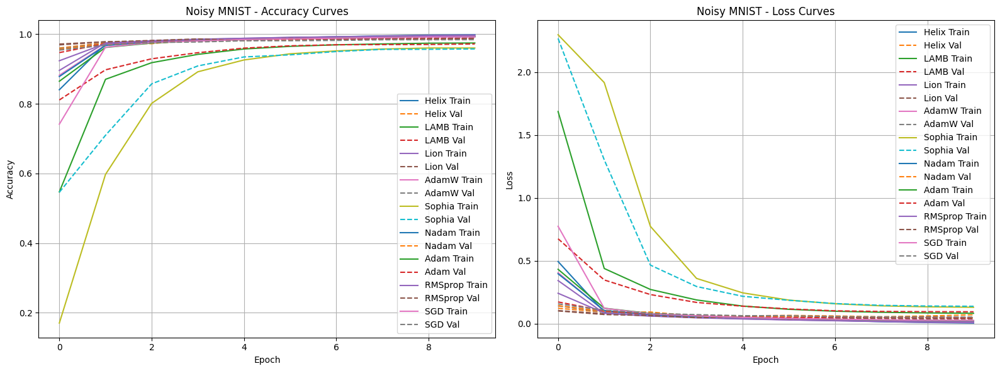

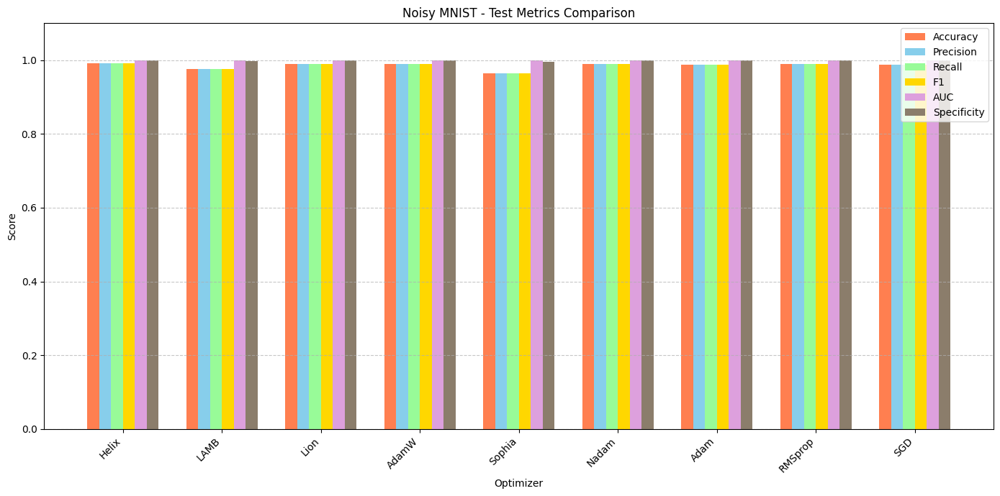

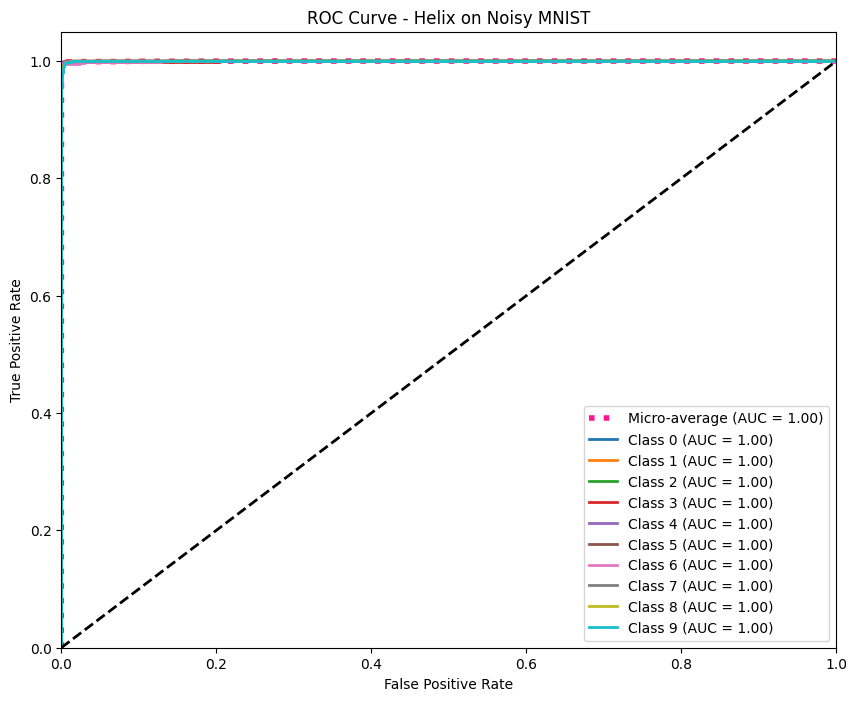

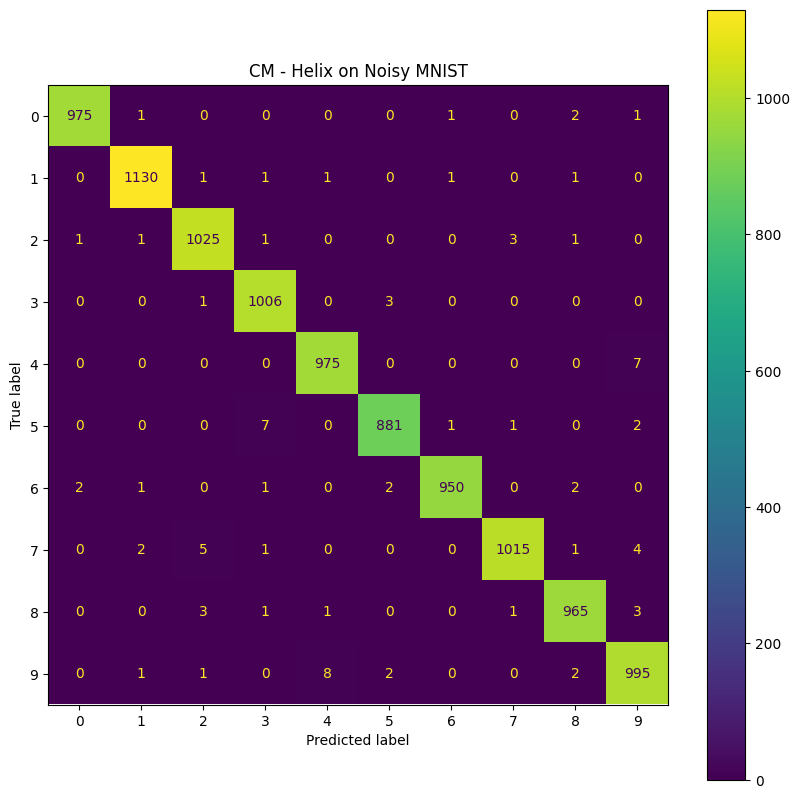

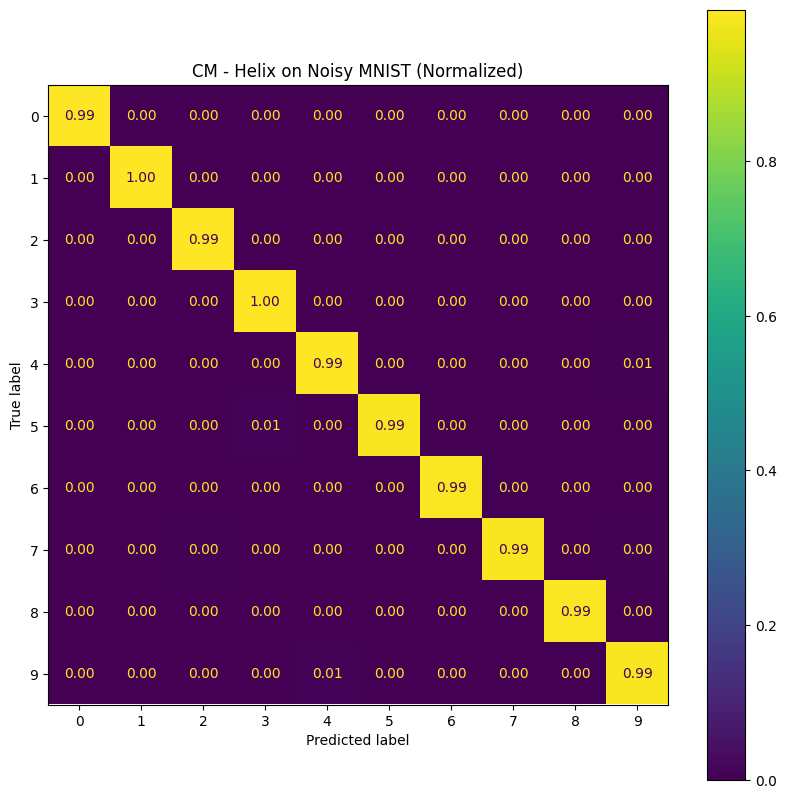

...

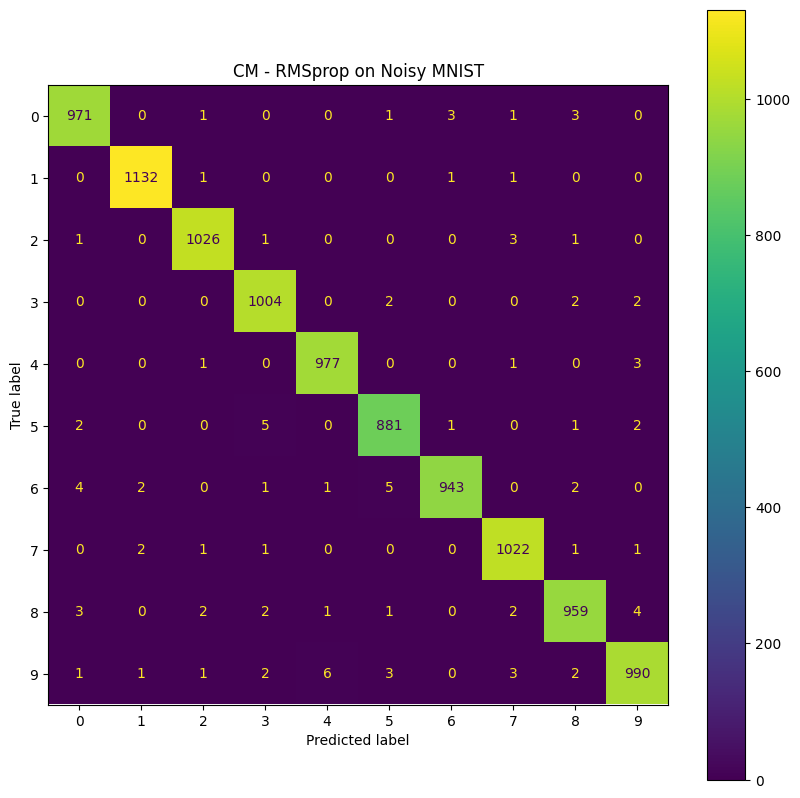

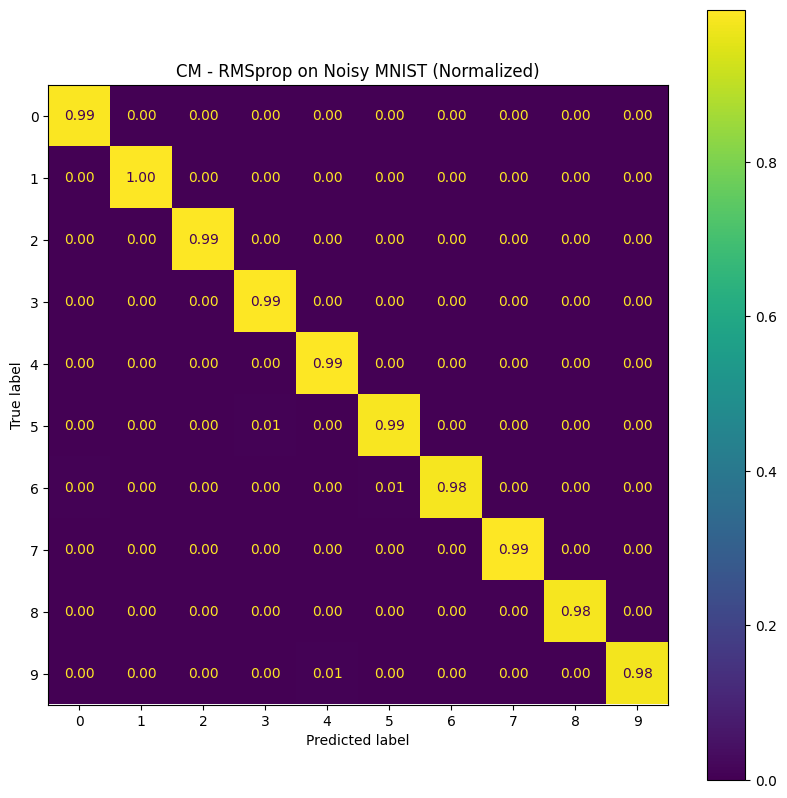

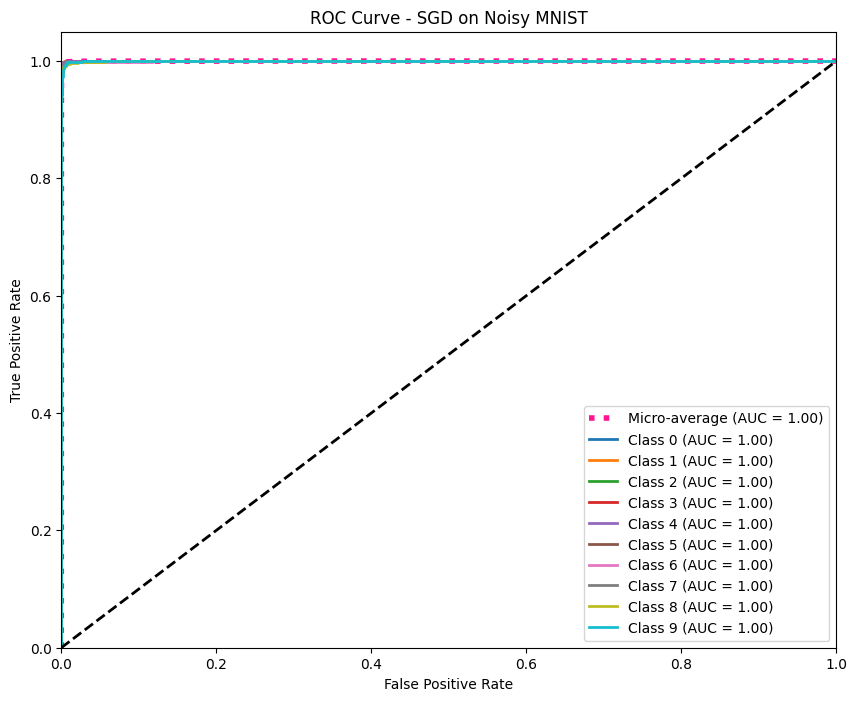

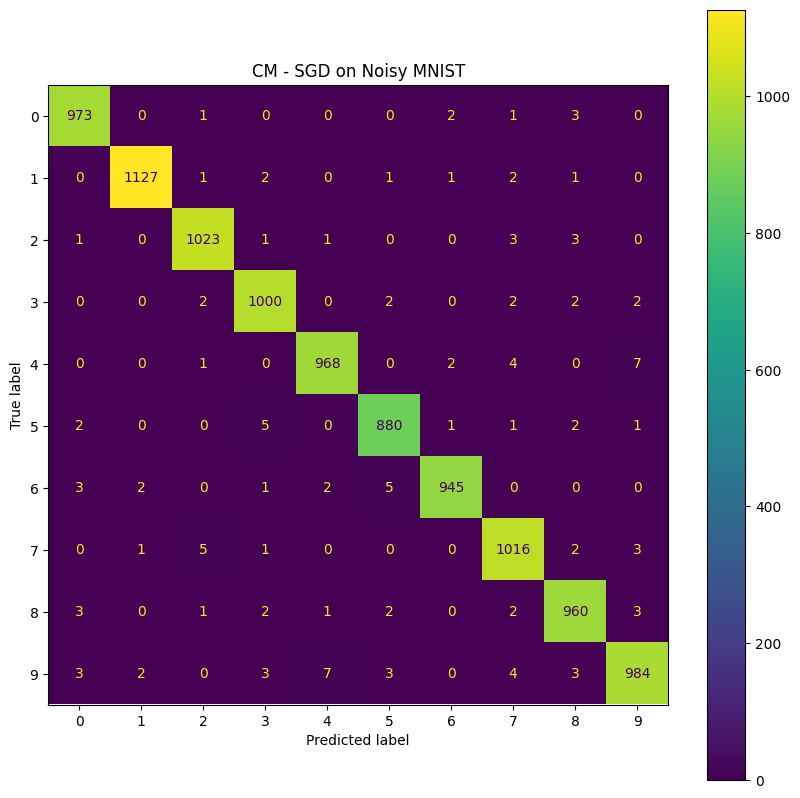

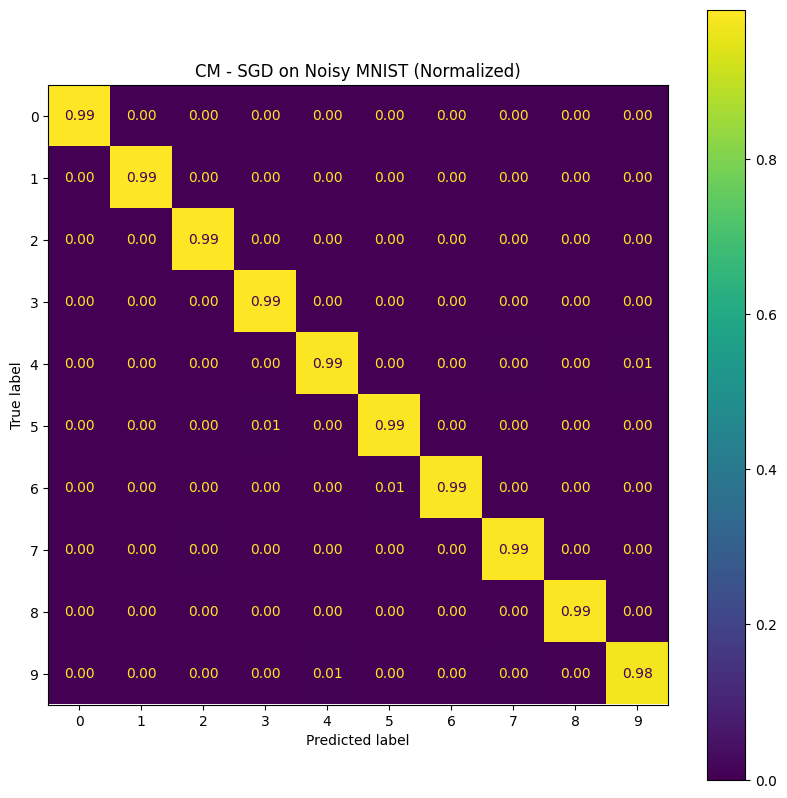


=== LaTeX Table for Noisy MNIST ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Helix & 0.0522 & 0.9917 & 0.9917 & 0.9916 & 0.9917 & 0.9999 & 0.9991 & 15.44 \\
LAMB & 0.0777 & 0.9754 & 0.9754 & 0.9752 & 0.9753 & 0.9996 & 0.9973 & 15.47 \\
Lion & 0.0441 & 0.9897 & 0.9897 & 0.9896 & 0.9896 & 0.9999 & 0.9989 & 14.64 \\
AdamW & 0.0325 & 0.9890 & 0.9889 & 0.9888 & 0.9888 & 0.9999 & 0.9988 & 14.42 \\
Sophia & 0.1179 & 0.9638 & 0.9637 & 0.9637 & 0.9637 & 0.9989 & 0.9960 & 14.82 \\
Nadam & 0.0308 & 0.9898 & 0.9897 & 0.9897 & 0.9897 & 0.9999 & 0.9989 & 14.54 \\
Adam & 0.0337 & 0.9876 & 0.9875 & 0.9874 & 0.9875 & 0.9999 & 0.9986 & 14.69 \\
RMSprop & 0.0287 & 0.9905 & 0.9904 & 0.9903 & 0.9904 & 0.9999 & 0.9989 & 14.63 \\
SGD & 0.0367 & 0.9876 & 0.9875 & 0.9875 & 0.9875 & 0.9999 & 0.9986 & 14.46 \\
\bottomrule
\end{tabular}
\caption{Performance Metrics for Noisy MNIS

In [ ]:
import os
import random
import time
from collections import Counter
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()

# Global settings
NUM_EPOCHS = 10
RESULTS_DIR = "results_noisy_mnist"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Optimizer Implementations
# ---------------------------

import torch
import torch.optim as optim
from torch.optim import Optimizer
import math

# ---------------------------
# Helix Optimizer
# ---------------------------
class Helix(Optimizer):
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), beta_s=0.9,
                 eps=1e-8, weight_decay=1e-2, agc=False,
                 phi_init=0.05, phi_final=0.4, phi_warmup=10000,
                 warmup_steps=1000, use_trust_ratio=False,
                 kappa=1.0, agc_clip=0.05):
        defaults = dict(lr=lr, betas=betas, beta_s=beta_s, eps=eps,
                        weight_decay=weight_decay, agc=agc,
                        phi_init=phi_init, phi_final=phi_final,
                        phi_warmup=phi_warmup, warmup_steps=warmup_steps,
                        use_trust_ratio=use_trust_ratio, kappa=kappa,
                        agc_clip=agc_clip)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr = group['lr']
            beta1, beta2 = group['betas']
            beta_s = group['beta_s']
            eps = group['eps']
            wd = group['weight_decay']
            phi_init = group['phi_init']
            phi_final = group['phi_final']
            phi_warmup = group['phi_warmup']
            warmup_steps = group['warmup_steps']
            use_trust = group['use_trust_ratio']
            kappa = group['kappa']
            agc_clip = group['agc_clip']
            use_agc = group['agc']

            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad
                if grad.is_sparse:
                    raise RuntimeError("Helix does not support sparse gradients")

                is_weight_like = (p.ndim > 1) and (p.numel() >= SMALL_PARAM_THRESHOLD)

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['b'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['s'] = torch.zeros_like(p, memory_format=torch.preserve_format)

                state['step'] += 1
                step = state['step']

                if (use_agc or use_trust) and is_weight_like:
                    param_norm = torch.linalg.vector_norm(p).clamp(min=eps)
                else:
                    param_norm = None

                if use_agc and is_weight_like:
                    grad_norm = torch.linalg.vector_norm(grad)
                    max_norm = agc_clip * param_norm
                    if grad_norm > max_norm:
                        grad.mul_(max_norm / (grad_norm + 1e-6))

                m = state['m']
                b = state['b']
                s = state['s']

                m.mul_(beta1).add_(grad, alpha=1.0 - beta1)
                diff = grad - m
                b.mul_(beta2).addcmul_(diff, diff, value=1.0 - beta2)

                bias_correction1 = 1.0 - beta1 ** step
                bias_correction2 = 1.0 - beta2 ** step
                m_hat = m / (bias_correction1 + 1e-16)
                b_hat = b / (bias_correction2 + 1e-16)
                d = b_hat.sqrt().add_(eps)

                s.mul_(beta_s).add_(m_hat.sign(), alpha=1.0 - beta_s)

                if step <= phi_warmup:
                    phi = phi_init + (phi_final - phi_init) * (step / max(1, phi_warmup))
                else:
                    phi = phi_final

                u_adapt = m_hat / d
                u_sign = s.clamp(-1.0, 1.0)
                delta = -((1.0 - phi) * u_adapt + phi * (kappa * u_sign))

                lr_t = lr * (step / max(1, warmup_steps)) if step <= warmup_steps else lr

                if use_trust and is_weight_like:
                    delta_norm = torch.linalg.vector_norm(delta)
                    if delta_norm > 0:
                        trust = (param_norm / (delta_norm + 1e-6)).clamp(0.01, 10.0)
                        delta.mul_(trust)

                p.add_(delta, alpha=lr_t)

                if wd != 0:
                    p.mul_(1.0 - lr_t * wd)

        return loss


class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for Noisy MNIST
# ---------------------------
class AddGaussianNoise(object):
    """Adds Gaussian noise to a tensor."""
    def __init__(self, mean=0., std=1.):
        self.std = std
        self.mean = mean

    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean

    def __repr__(self):
        return self.__class__.__name__ + f'(mean={self.mean}, std={self.std})'

class LeNet5(nn.Module):
    """A simple LeNet-5 style CNN for MNIST classification."""
    def __init__(self):
        super(LeNet5, self).__init__()
        self.network = nn.Sequential(
            nn.Conv2d(1, 6, kernel_size=5, padding=2), # 28x28 -> 28x28
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 28x28 -> 14x14
            nn.Conv2d(6, 16, kernel_size=5), # 14x14 -> 10x10
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 10x10 -> 5x5
            nn.Flatten(),
            nn.Linear(16 * 5 * 5, 120),
            nn.ReLU(),
            nn.Linear(120, 84),
            nn.ReLU(),
            nn.Linear(84, 10)
        )
    def forward(self, x):
        return self.network(x)

def get_noisy_mnist_loaders(batch_size=128, data_root="./data", noise_std=0.3):
    """Creates and returns Noisy MNIST DataLoaders."""
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,)),
        AddGaussianNoise(0., noise_std)
    ])
    train_dataset = datasets.MNIST(root=data_root, train=True, download=True, transform=transform)
    test_dataset = datasets.MNIST(root=data_root, train=False, download=True, transform=transform)

    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    return train_loader, val_loader, test_loader

# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="Noisy MNIST", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizer Registry # Manual configuration
# ---------------------------
optimizers = {    'Helix': lambda params: Helix(params,
                 lr=1e-2,
                 betas=(0.9, 0.99),
                 beta_s=0.99,
                 eps=1e-8,
                 weight_decay=1e-2,
                 agc=False,
                 phi_init=0.05,
                 phi_final=0.4,
                 phi_warmup=10000,
                 warmup_steps=1000,
                 use_trust_ratio=False,
                 kappa=1.0),

    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}


# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()



def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    # Beautiful color palette (only change)
    colors = ['#FF7F50', '#87CEEB', '#98FB98', '#FFD700', '#DDA0DD', '#8B7D6B']  # Soft coral, sky blue, light green, gold, plum, chocolate

    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()



def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    # Corrected MatplotlibDeprecationWarning
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'Class {class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_').replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    noisy_mnist_class_names = [str(i) for i in range(10)]
    train_loader, val_loader, test_loader = get_noisy_mnist_loaders()

    results_noisy_mnist = {}
    for opt_name, opt_factory in optimizers.items():
        results_noisy_mnist[opt_name] = train_model(
            LeNet5, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="Noisy MNIST", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for Noisy MNIST ---")
    plot_learning_curves(results_noisy_mnist, "Noisy MNIST", save_path=os.path.join(RESULTS_DIR, "noisy_mnist_learning_curves.png"))
    plot_test_metrics(results_noisy_mnist, "Noisy MNIST", save_path=os.path.join(RESULTS_DIR, "noisy_mnist_test_metrics.png"))

    for opt_name, result in results_noisy_mnist.items():
        plot_roc_curves(result, opt_name, noisy_mnist_class_names, "Noisy MNIST", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, noisy_mnist_class_names, "Noisy MNIST", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, noisy_mnist_class_names, "Noisy MNIST", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_noisy_mnist, "Noisy MNIST")
    print("\n=== LaTeX Table for Noisy MNIST ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "noisy_mnist_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "noisy_mnist_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_noisy_mnist.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_noisy_mnist"
# Define the name for the zip file
zip_filename = "/content/results_noisy_mnist.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_noisy_mnist.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 4-SST-2

In [ ]:
# !rm -rf data

Setting random seed for reproducibility...
Loading SST-2 dataset...


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Dataset loaded. Splitting data...
Building vocabulary...
Vocabulary built. Size: 14763
Creating data loaders...
Data preparation complete.

--- SST-2: Training with Helix ---
Using device: cuda
Epoch 1/10 - Train Loss: 0.6702, Acc: 0.5830 | Val Loss: 0.6074, Acc: 0.6794
Epoch 2/10 - Train Loss: 0.4801, Acc: 0.7899 | Val Loss: 0.3864, Acc: 0.8423
Epoch 3/10 - Train Loss: 0.3155, Acc: 0.8804 | Val Loss: 0.3061, Acc: 0.8797
Epoch 4/10 - Train Loss: 0.2536, Acc: 0.9056 | Val Loss: 0.2833, Acc: 0.8925
Epoch 5/10 - Train Loss: 0.2265, Acc: 0.9150 | Val Loss: 0.2821, Acc: 0.8993
Epoch 6/10 - Train Loss: 0.2133, Acc: 0.9200 | Val Loss: 0.2876, Acc: 0.8989
Epoch 7/10 - Train Loss: 0.2066, Acc: 0.9226 | Val Loss: 0.2942, Acc: 0.8992
Epoch 8/10 - Train Loss: 0.2011, Acc: 0.9248 | Val Loss: 0.2988, Acc: 0.9014
Epoch 9/10 - Train Loss: 0.1979, Acc: 0.9268 | Val Loss: 0.3019, Acc: 0.9002
Epoch 10/10 - Train Loss: 0.1957, Acc: 0.9278 | Val Loss: 0.3034, Acc: 0.9011

Final Results on SST-2: Test Loss:

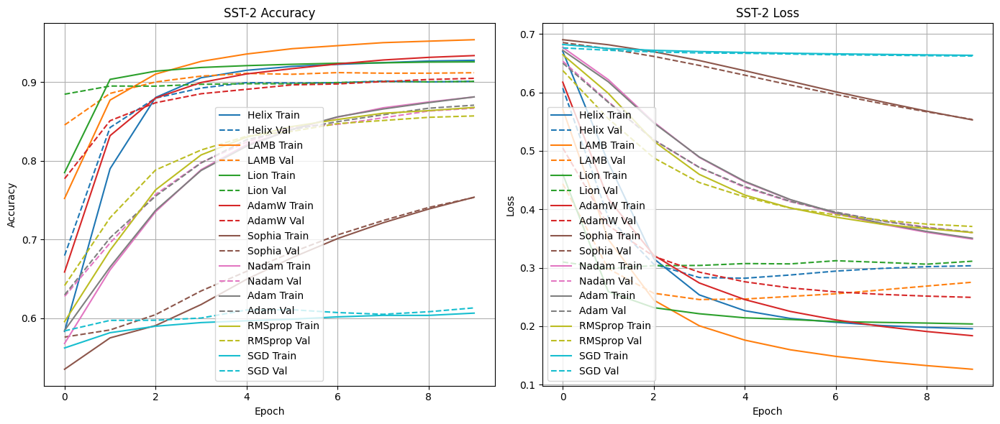

Saved test metrics plot to results/test_metrics_sst2.png


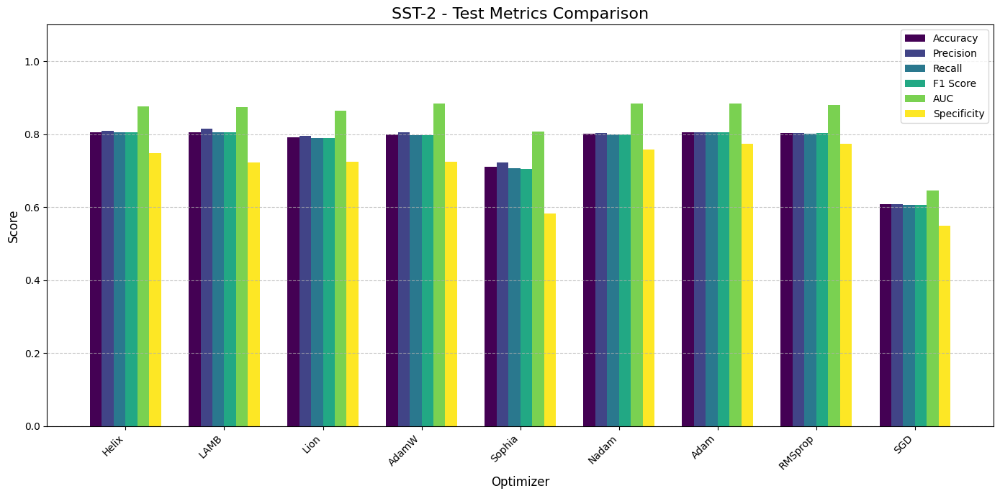


--- Generating Optimizer-Specific Plots ---
Saved ROC curve to results/roc_curve_sst2_Helix.png


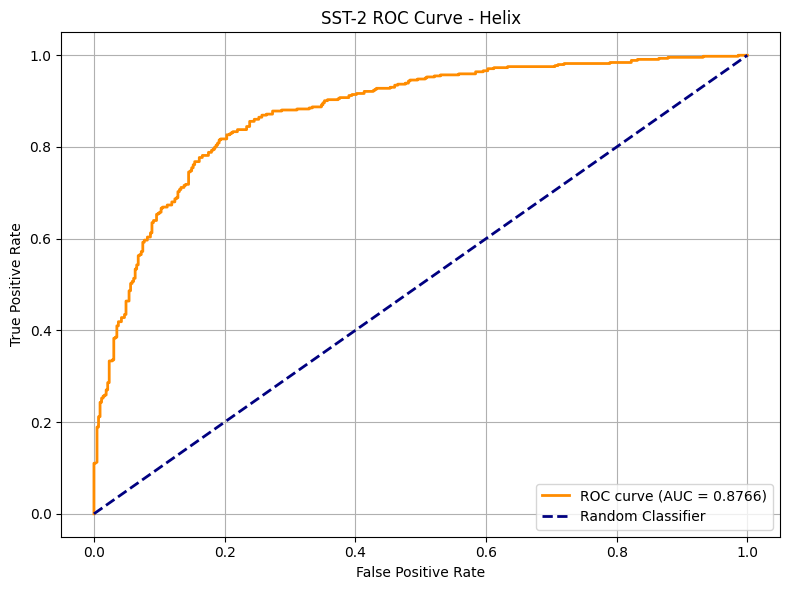

Saved raw confusion matrix to results/cm_raw_sst-2_Helix.png


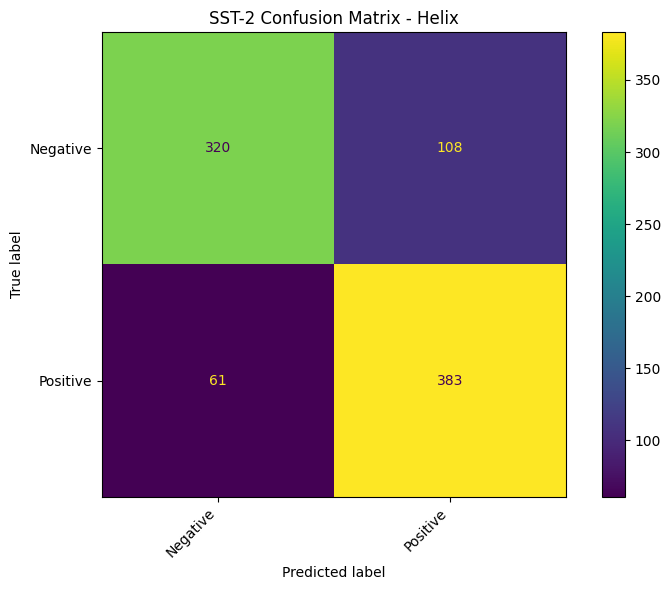

Saved normalized confusion matrix to results/cm_normalized_sst-2_Helix.png


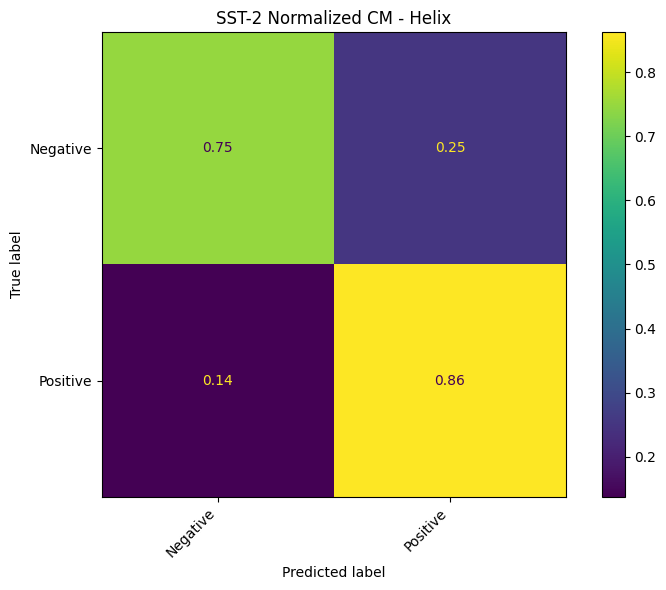

Saved ROC curve to results/roc_curve_sst2_LAMB.png


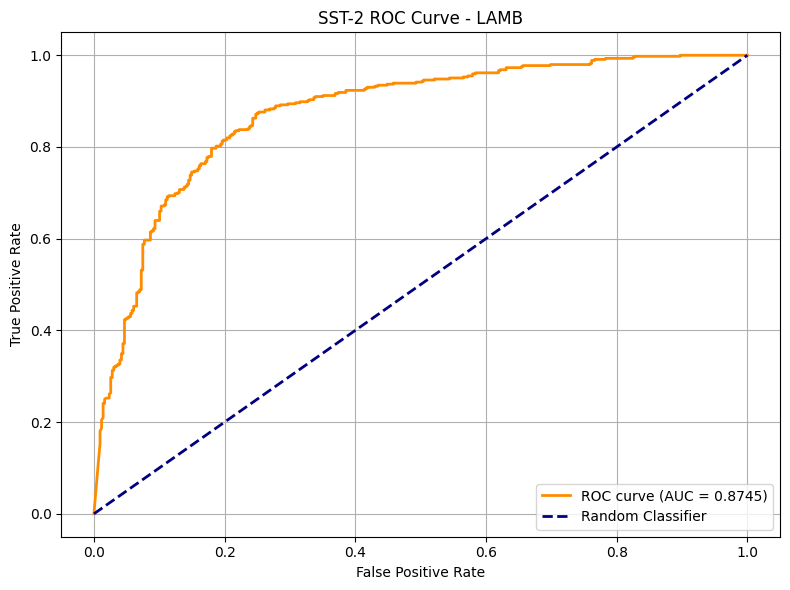

Saved raw confusion matrix to results/cm_raw_sst-2_LAMB.png


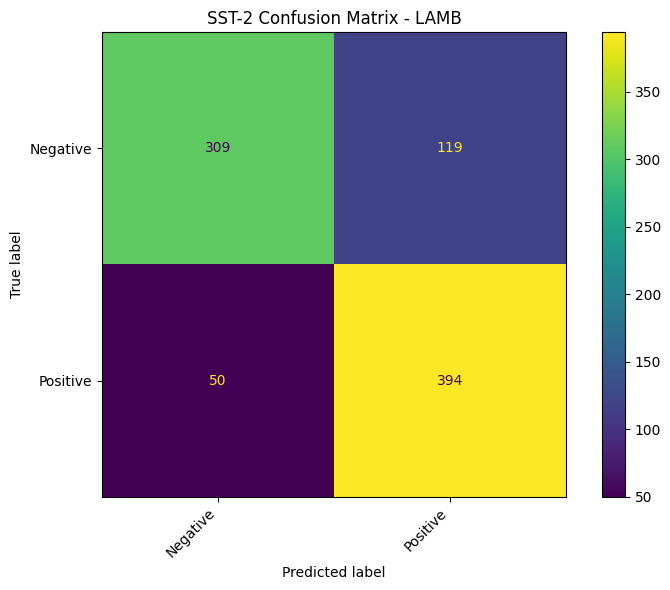

Saved normalized confusion matrix to results/cm_normalized_sst-2_LAMB.png


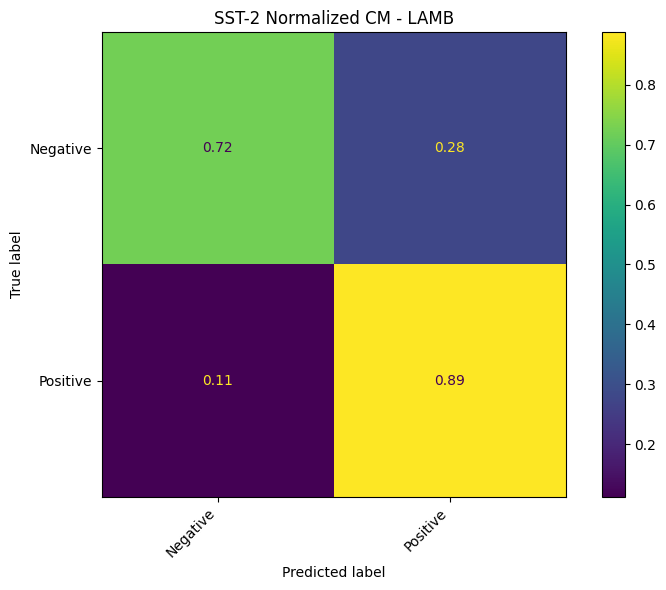

Saved ROC curve to results/roc_curve_sst2_Lion.png


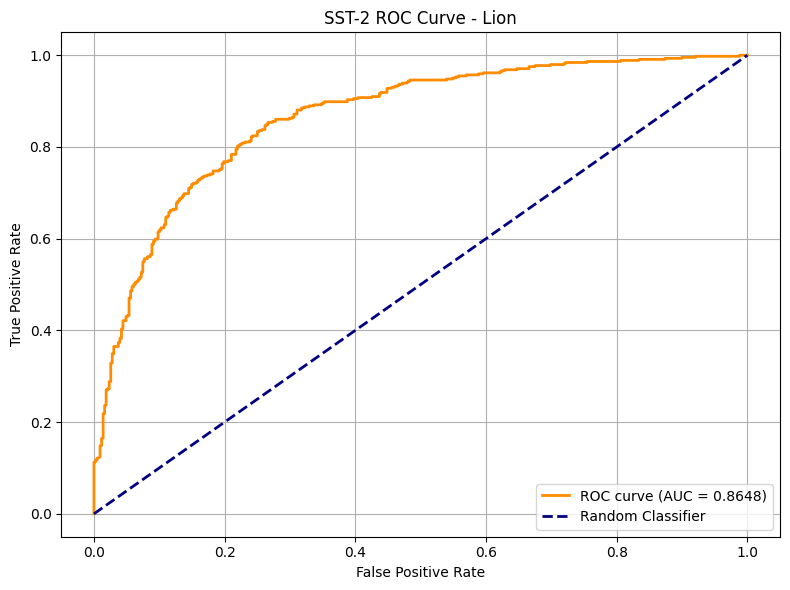

Saved raw confusion matrix to results/cm_raw_sst-2_Lion.png


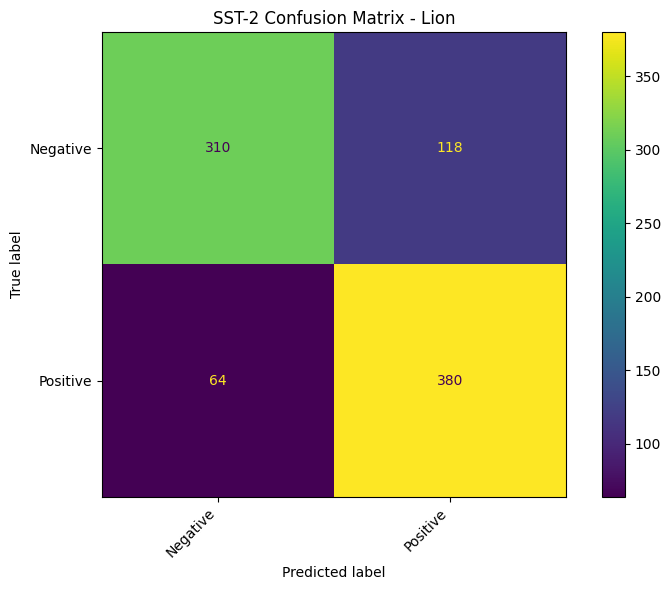

Saved normalized confusion matrix to results/cm_normalized_sst-2_Lion.png


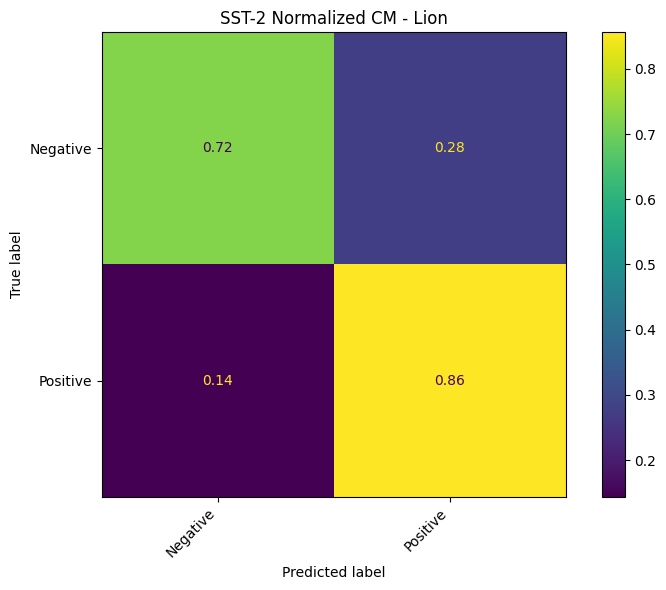

Saved ROC curve to results/roc_curve_sst2_AdamW.png


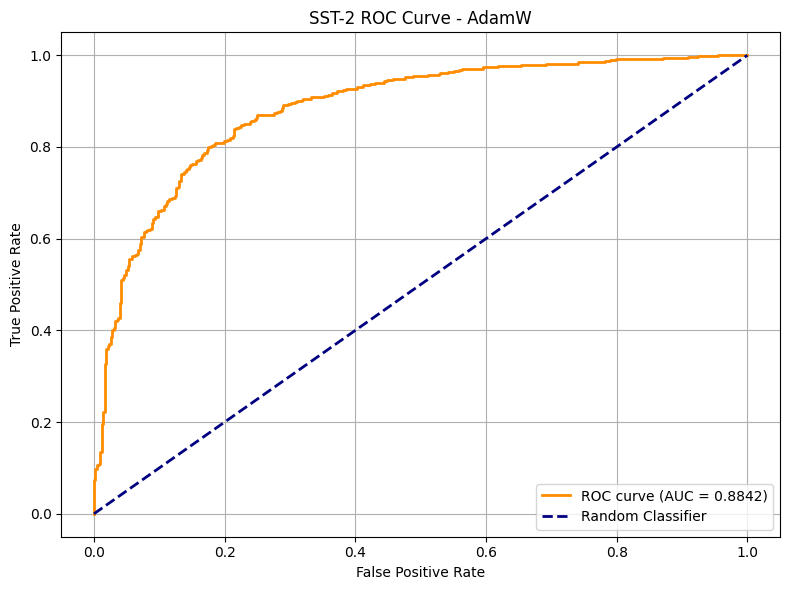

Saved raw confusion matrix to results/cm_raw_sst-2_AdamW.png


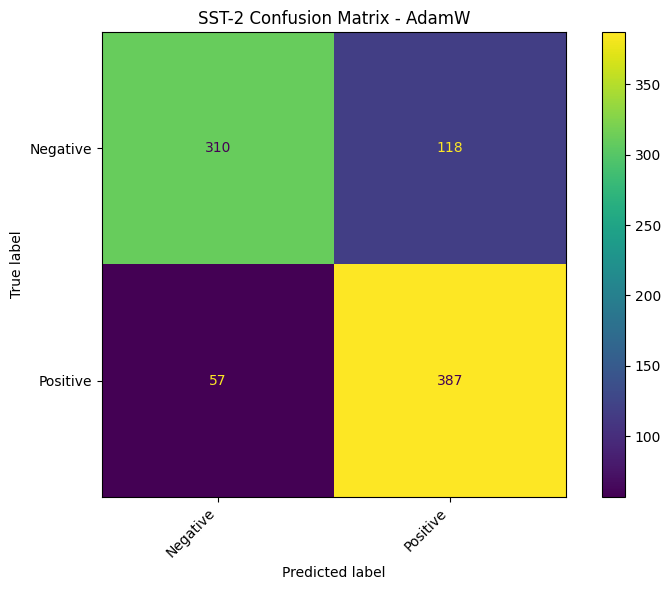

Saved normalized confusion matrix to results/cm_normalized_sst-2_AdamW.png


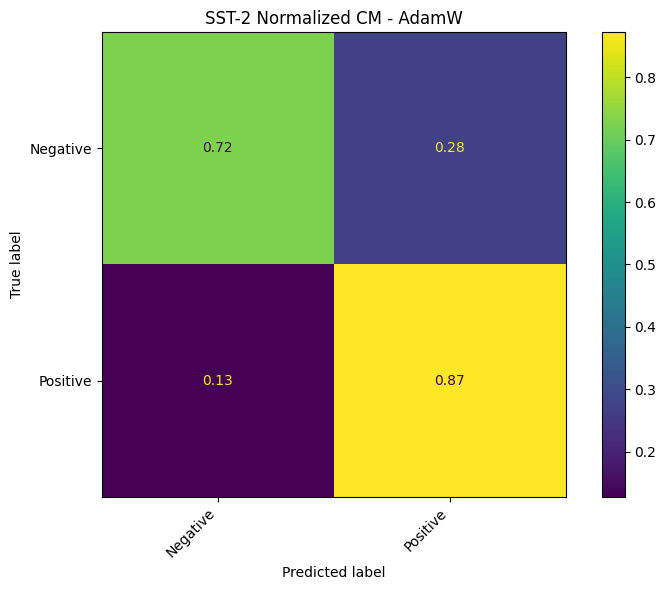

Saved ROC curve to results/roc_curve_sst2_Sophia.png


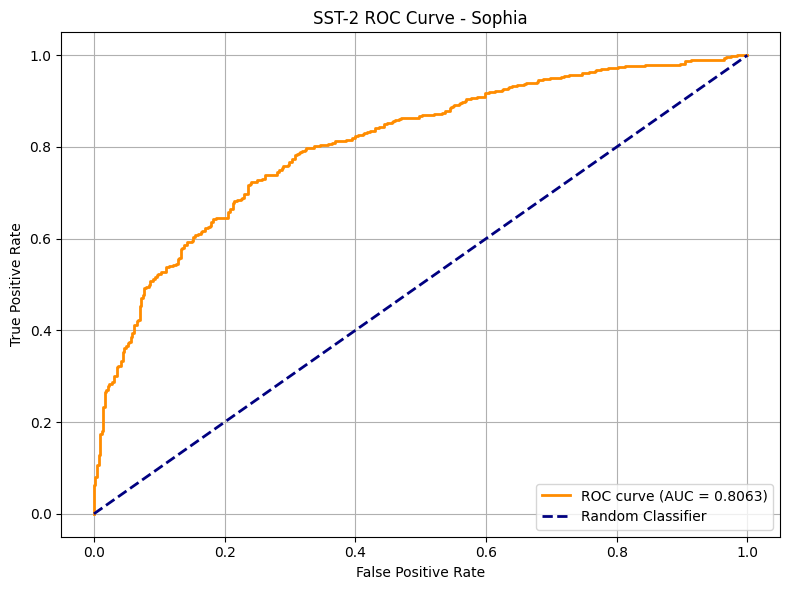

Saved raw confusion matrix to results/cm_raw_sst-2_Sophia.png


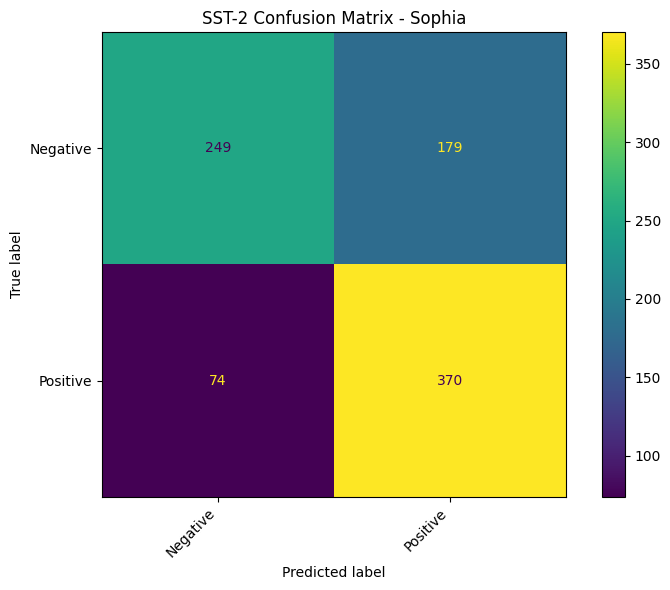

Saved normalized confusion matrix to results/cm_normalized_sst-2_Sophia.png


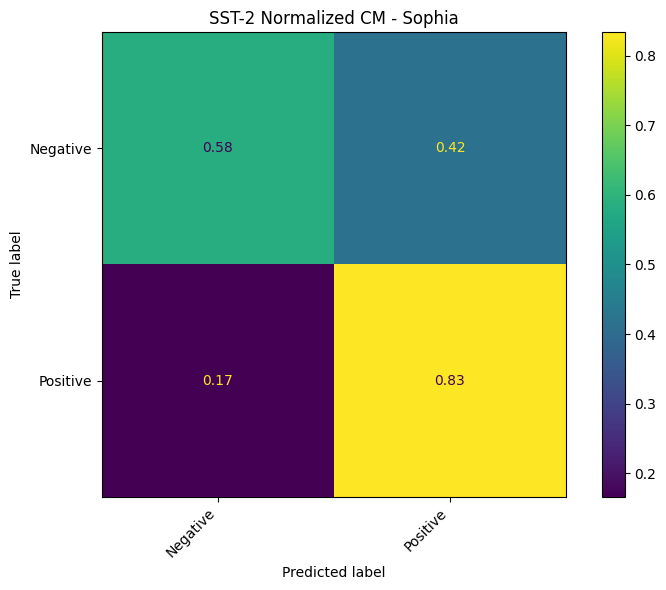

Saved ROC curve to results/roc_curve_sst2_Nadam.png


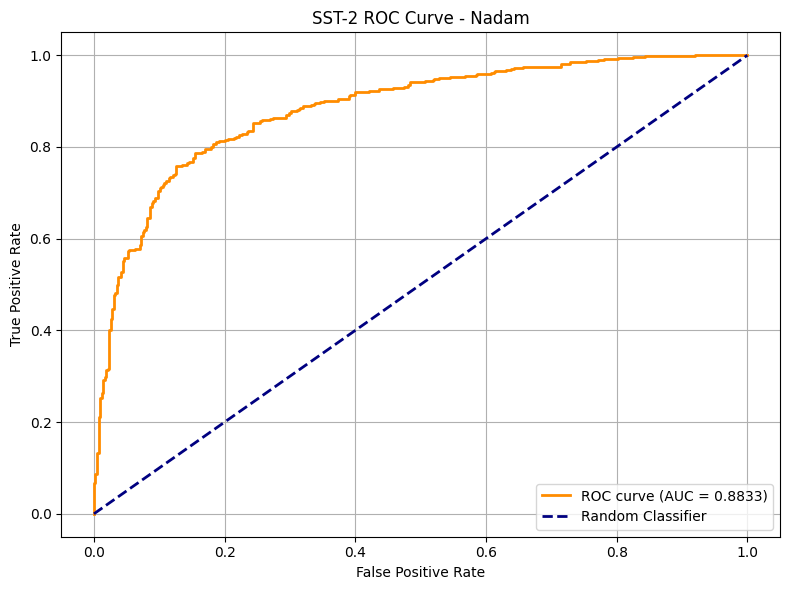

Saved raw confusion matrix to results/cm_raw_sst-2_Nadam.png


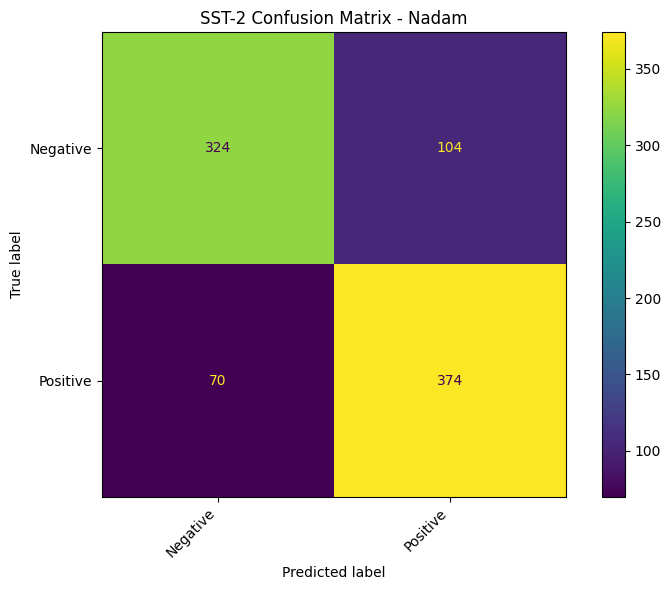

Saved normalized confusion matrix to results/cm_normalized_sst-2_Nadam.png


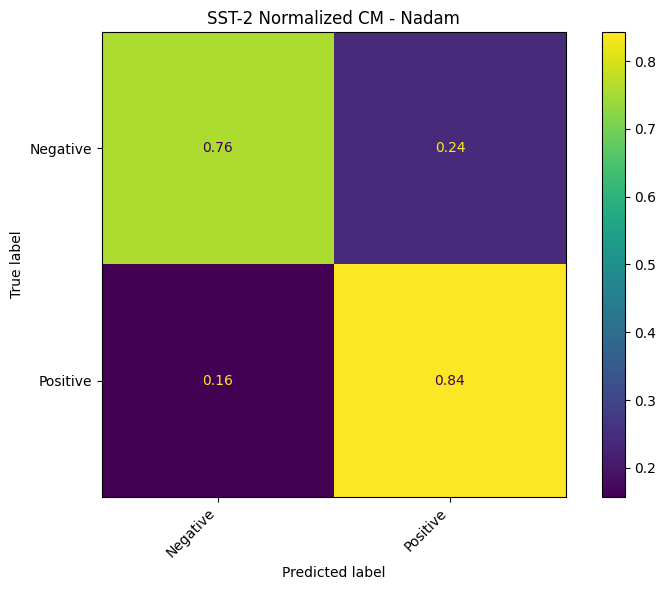

Saved ROC curve to results/roc_curve_sst2_Adam.png


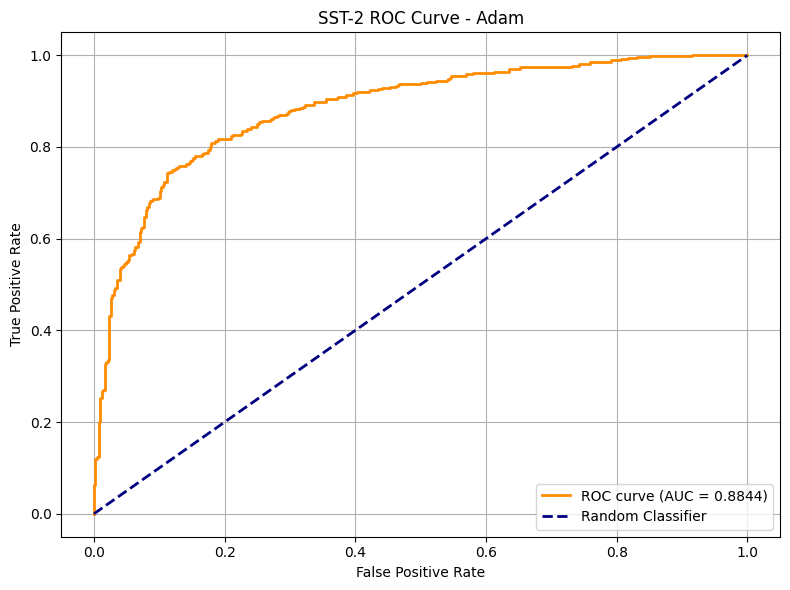

Saved raw confusion matrix to results/cm_raw_sst-2_Adam.png


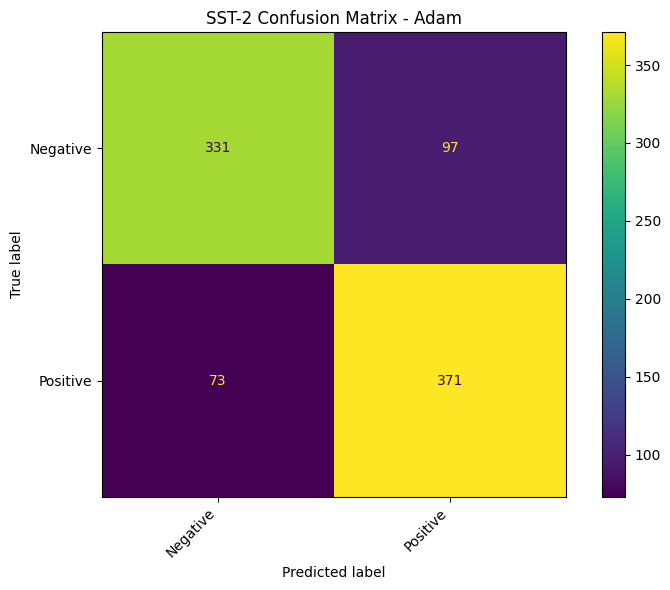

Saved normalized confusion matrix to results/cm_normalized_sst-2_Adam.png


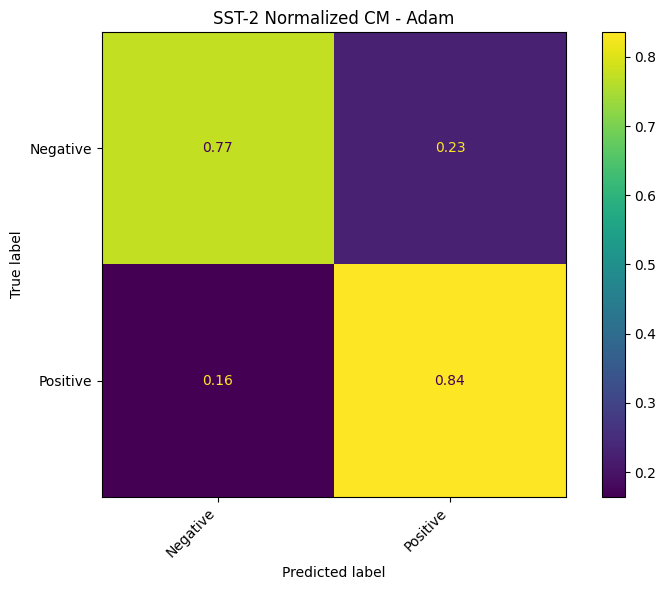

Saved ROC curve to results/roc_curve_sst2_RMSprop.png


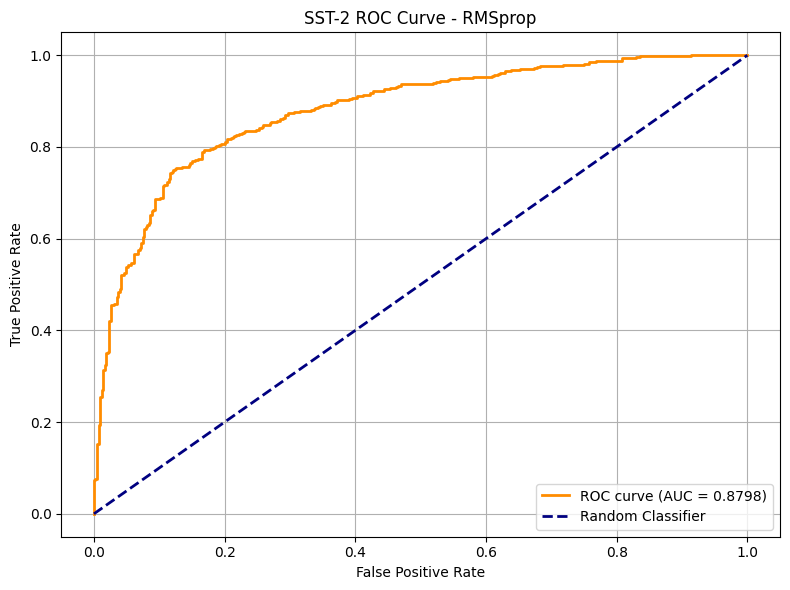

Saved raw confusion matrix to results/cm_raw_sst-2_RMSprop.png


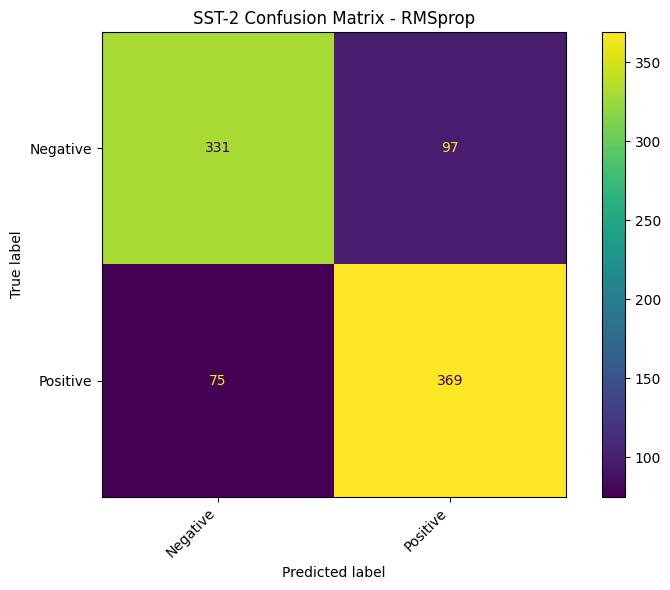

Saved normalized confusion matrix to results/cm_normalized_sst-2_RMSprop.png


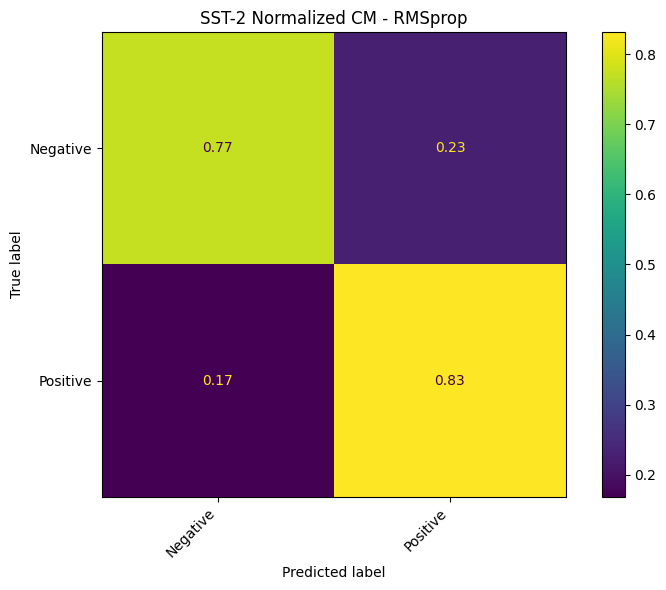

Saved ROC curve to results/roc_curve_sst2_SGD.png


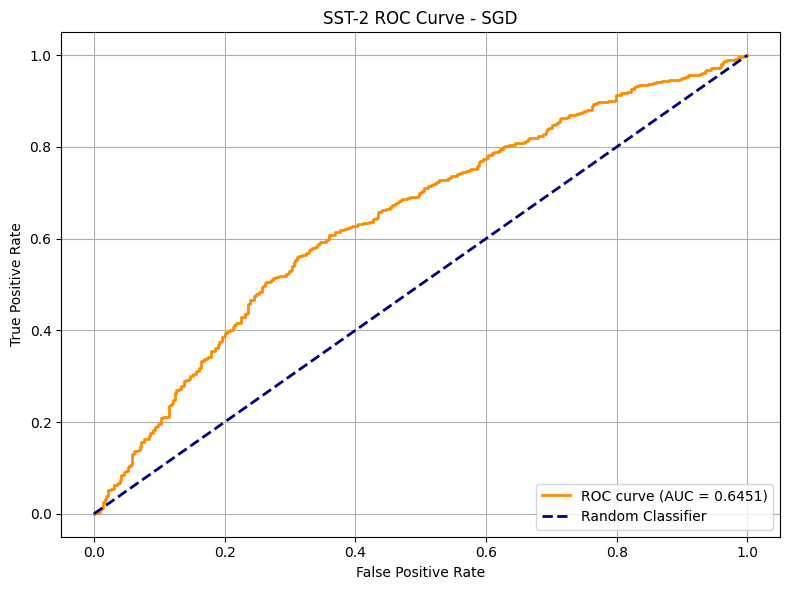

Saved raw confusion matrix to results/cm_raw_sst-2_SGD.png


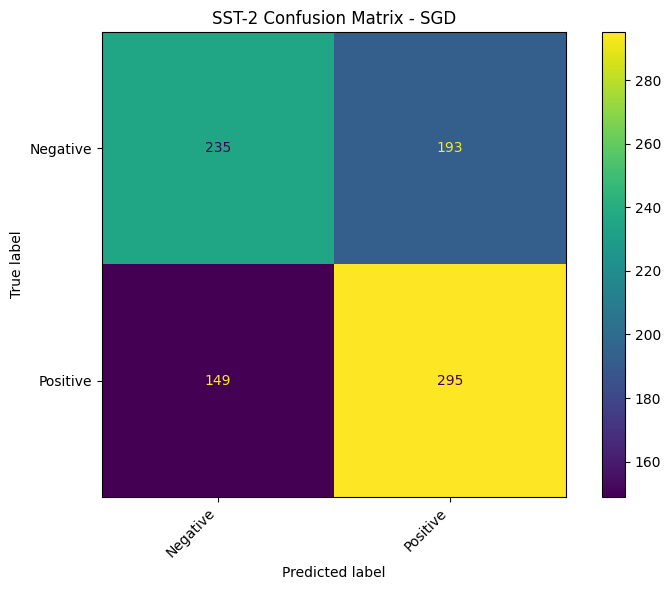

Saved normalized confusion matrix to results/cm_normalized_sst-2_SGD.png


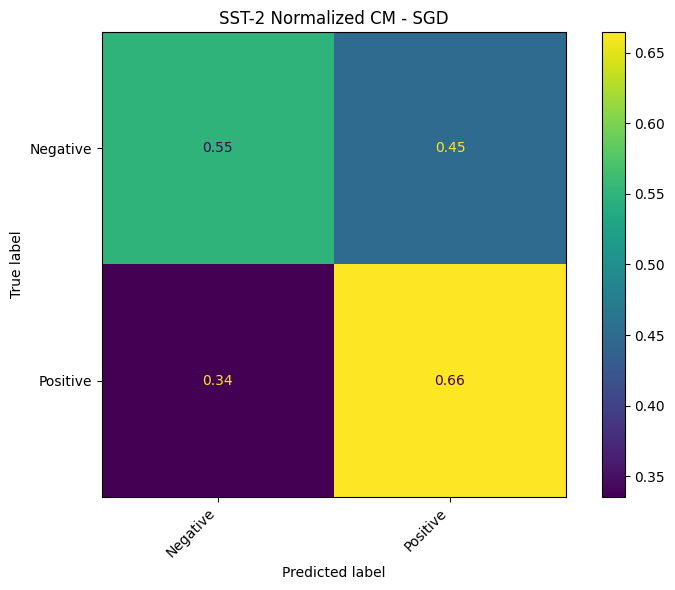

Saved raw results to results/benchmark_results_sst2.json
Saved LaTeX table to results/results_table_sst2.tex

=== LaTeX Table for SST-2 ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Helix & 0.6713 & 0.8062 & 0.8100 & 0.8051 & 0.8052 & 0.8766 & 0.7477 & 13.38 \\
LAMB & 1.0106 & 0.8062 & 0.8144 & 0.8047 & 0.8043 & 0.8745 & 0.7220 & 13.47 \\
Lion & 0.6760 & 0.7913 & 0.7960 & 0.7901 & 0.7899 & 0.8648 & 0.7243 & 12.66 \\
AdamW & 0.6131 & 0.7993 & 0.8055 & 0.7980 & 0.7977 & 0.8842 & 0.7243 & 13.04 \\
Sophia & 0.5733 & 0.7099 & 0.7224 & 0.7076 & 0.7042 & 0.8063 & 0.5818 & 12.87 \\
Nadam & 0.4347 & 0.8005 & 0.8024 & 0.7997 & 0.7998 & 0.8833 & 0.7570 & 13.04 \\
Adam & 0.4316 & 0.8050 & 0.8060 & 0.8045 & 0.8046 & 0.8844 & 0.7734 & 12.96 \\
RMSprop & 0.4384 & 0.8028 & 0.8036 & 0.8022 & 0.8024 & 0.8798 & 0.7734 & 12.76 \\
SGD & 0.6662 & 0.6078 & 0.6082 & 0.6067 & 0.

In [ ]:
import os
import random
import time
from collections import Counter
import nltk
nltk.download('punkt_tab')
from nltk.tokenize import word_tokenize
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
from torch.nn.utils.rnn import pad_sequence
from torch.utils.tensorboard import SummaryWriter
from datasets import load_dataset
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from huggingface_hub import notebook_login
from typing import Iterable, Tuple, Optional
import json

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()
# Corrected NLTK download call
nltk.download('punkt', quiet=True)

# Set the number of training epochs
num_epochs = 10

# Create a directory to save results
os.makedirs('results', exist_ok=True)
SMALL_PARAM_THRESHOLD = 1024  # skip AGC/trust for tiny tensors to save norms

# ---------------------------
# Optimizer Implementations
# ---------------------------

import torch
import torch.optim as optim
from torch.optim import Optimizer
import math

# ---------------------------
# Helix Optimizer
# ---------------------------
class Helix(Optimizer):
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), beta_s=0.9,
                 eps=1e-8, weight_decay=1e-2, agc=False,
                 phi_init=0.05, phi_final=0.4, phi_warmup=10000,
                 warmup_steps=1000, use_trust_ratio=False,
                 kappa=1.0, agc_clip=0.05):
        defaults = dict(lr=lr, betas=betas, beta_s=beta_s, eps=eps,
                        weight_decay=weight_decay, agc=agc,
                        phi_init=phi_init, phi_final=phi_final,
                        phi_warmup=phi_warmup, warmup_steps=warmup_steps,
                        use_trust_ratio=use_trust_ratio, kappa=kappa,
                        agc_clip=agc_clip)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr = group['lr']
            beta1, beta2 = group['betas']
            beta_s = group['beta_s']
            eps = group['eps']
            wd = group['weight_decay']
            phi_init = group['phi_init']
            phi_final = group['phi_final']
            phi_warmup = group['phi_warmup']
            warmup_steps = group['warmup_steps']
            use_trust = group['use_trust_ratio']
            kappa = group['kappa']
            agc_clip = group['agc_clip']
            use_agc = group['agc']

            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad
                if grad.is_sparse:
                    raise RuntimeError("Helix does not support sparse gradients")

                is_weight_like = (p.ndim > 1) and (p.numel() >= SMALL_PARAM_THRESHOLD)

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['b'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['s'] = torch.zeros_like(p, memory_format=torch.preserve_format)

                state['step'] += 1
                step = state['step']

                if (use_agc or use_trust) and is_weight_like:
                    param_norm = torch.linalg.vector_norm(p).clamp(min=eps)
                else:
                    param_norm = None

                if use_agc and is_weight_like:
                    grad_norm = torch.linalg.vector_norm(grad)
                    max_norm = agc_clip * param_norm
                    if grad_norm > max_norm:
                        grad.mul_(max_norm / (grad_norm + 1e-6))

                m = state['m']
                b = state['b']
                s = state['s']

                m.mul_(beta1).add_(grad, alpha=1.0 - beta1)
                diff = grad - m
                b.mul_(beta2).addcmul_(diff, diff, value=1.0 - beta2)

                bias_correction1 = 1.0 - beta1 ** step
                bias_correction2 = 1.0 - beta2 ** step
                m_hat = m / (bias_correction1 + 1e-16)
                b_hat = b / (bias_correction2 + 1e-16)
                d = b_hat.sqrt().add_(eps)

                s.mul_(beta_s).add_(m_hat.sign(), alpha=1.0 - beta_s)

                if step <= phi_warmup:
                    phi = phi_init + (phi_final - phi_init) * (step / max(1, phi_warmup))
                else:
                    phi = phi_final

                u_adapt = m_hat / d
                u_sign = s.clamp(-1.0, 1.0)
                delta = -((1.0 - phi) * u_adapt + phi * (kappa * u_sign))

                lr_t = lr * (step / max(1, warmup_steps)) if step <= warmup_steps else lr

                if use_trust and is_weight_like:
                    delta_norm = torch.linalg.vector_norm(delta)
                    if delta_norm > 0:
                        trust = (param_norm / (delta_norm + 1e-6)).clamp(0.01, 10.0)
                        delta.mul_(trust)

                p.add_(delta, alpha=lr_t)

                if wd != 0:
                    p.mul_(1.0 - lr_t * wd)

        return loss

         
# ---------------------------
# Sophia Optimizer
# ---------------------------
class Sophia(optim.Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

# ---------------------------
# Lion Optimizer
# ---------------------------
class Lion(optim.Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.99), weight_decay=1e-3):
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad.data
                state = self.state[p]
                if len(state) == 0: state['exp_avg'] = torch.zeros_like(p)
                exp_avg = state['exp_avg']
                beta1, lr, wd = group['betas'][0], group['lr'], group['weight_decay']
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(torch.sign(exp_avg), alpha=-lr)
        return loss

# ---------------------------
# Text Classification Model
# ---------------------------
class TextClassificationModel(nn.Module):
    """A simple text classification model with an embedding layer."""
    def __init__(self, vocab_size, embed_dim=64, num_class=2, pad_idx=1):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=pad_idx)
        self.classifier = nn.Linear(embed_dim, num_class)

    def forward(self, text):
        emb = self.embedding(text)
        pooled = emb.mean(dim=1)
        return self.classifier(pooled)

# ---------------------------
# Data Preparation: SST-2
# ---------------------------
print("Loading SST-2 dataset...", flush=True)
dataset = load_dataset("sst2")
print("Dataset loaded. Splitting data...", flush=True)
train_raw, val_raw = random_split(dataset['train'], [int(0.9*len(dataset['train'])), len(dataset['train'])-int(0.9*len(dataset['train']))])
test_raw = dataset['validation']

print("Building vocabulary...", flush=True)
counter = Counter()
for item in train_raw:
    counter.update(word_tokenize(item['sentence'].lower()))
vocab = {'<unk>': 0, '<pad>': 1, **{tok: i for i, tok in enumerate(counter, 2)}}
pad_idx, unk_idx = vocab['<pad>'], vocab['<unk>']
print(f"Vocabulary built. Size: {len(vocab)}", flush=True)

def text_pipeline(text):
    return [vocab.get(tok, unk_idx) for tok in word_tokenize(text.lower())]

class SST2Dataset(Dataset):
    def __init__(self, subset): self.subset = subset
    def __len__(self): return len(self.subset)
    def __getitem__(self, idx): return self.subset[idx]['sentence'], self.subset[idx]['label']

def collate_batch(batch):
    texts, labels = zip(*batch)
    seqs = [torch.tensor(text_pipeline(t), dtype=torch.long) for t in texts]
    return pad_sequence(seqs, batch_first=True, padding_value=pad_idx), torch.tensor(labels, dtype=torch.long)

print("Creating data loaders...", flush=True)
train_loader_sst2 = DataLoader(SST2Dataset(train_raw), batch_size=64, shuffle=True, collate_fn=collate_batch)
val_loader_sst2 = DataLoader(SST2Dataset(val_raw), batch_size=64, shuffle=False, collate_fn=collate_batch)
test_loader_sst2 = DataLoader(SST2Dataset(test_raw), batch_size=64, shuffle=False, collate_fn=collate_batch)
sst2_class_names = ['Negative', 'Positive']
print("Data preparation complete.", flush=True)

# ---------------------------
# Generic Train & Evaluate Function
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader, num_epochs=num_epochs, dataset_name="Dataset"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}", flush=True)
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.9)
    writer = SummaryWriter(log_dir=f"runs/{dataset_name}_{optimizer.__class__.__name__}_{int(time.time())}")
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    start_time = time.time()

    for epoch in range(num_epochs):
        model.train()
        train_loss, correct, total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            total += targets.size(0)
            correct += preds.eq(targets).sum().item()
        train_loss /= total
        train_acc = correct / total
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()
        val_loss /= val_total
        val_acc = val_correct / val_total
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}", flush=True)
        scheduler.step()

    model.eval()
    test_loss, test_correct, test_total = 0.0, 0, 0
    all_preds, all_targets, all_probs = [], [], []
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            probs = torch.softmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            test_correct += preds.eq(targets).sum().item()
            test_total += targets.size(0)

    # --- METRIC CALCULATIONS ---
    test_loss /= test_total
    test_acc = test_correct / test_total
    precision = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    recall = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    f1 = f1_score(all_targets, all_preds, average='macro', zero_division=0)

    # Calculate Confusion Matrix for Specificity
    cm = confusion_matrix(all_targets, all_preds)
    tn, fp, fn, tp = cm.ravel() if len(cm.ravel()) == 4 else (cm[0,0], 0, 0, 0) # Handle edge cases
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0

    # Calculate AUC
    y_score = np.array(all_probs)[:, 1] # Probability of the positive class
    fpr, tpr, _ = roc_curve(all_targets, y_score)
    roc_auc = auc(fpr, tpr)

    history.update({
        'test_loss': test_loss, 'test_acc': test_acc, 'precision': precision,
        'recall': recall, 'f1': f1, 'specificity': specificity, 'auc': roc_auc,
        'runtime': time.time() - start_time,
        'targets': all_targets, 'preds': all_preds, 'probs': all_probs
    })
    print(f"\nFinal Results on {dataset_name}: Test Loss: {test_loss:.4f}, Acc: {test_acc:.4f}, F1: {f1:.4f}, AUC: {roc_auc:.4f}\n", flush=True)
    writer.close()
    return history

# ---------------------------
# Optimizer Registry # Manual configuration
# ---------------------------
optimizers = {    'Helix': lambda params: Helix(params,
                 lr=1e-3,
                 betas=(0.9, 0.99),
                 beta_s=0.99,
                 eps=1e-8,
                 weight_decay=1e-2,
                 agc=False,
                 phi_init=0.05,
                 phi_final=0.4,
                 phi_warmup=10000,
                 warmup_steps=1000,
                 use_trust_ratio=False,
                 kappa=1.0),

    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}
# ---------------------------
# Run Experiments for SST-2
# ---------------------------
results_sst2 = {}
for opt_name, opt_factory in optimizers.items():
    print(f'\n--- SST-2: Training with {opt_name} ---', flush=True)
    results_sst2[opt_name] = train_model(
        lambda: TextClassificationModel(len(vocab), 64, 2, pad_idx),
        opt_factory, train_loader_sst2, val_loader_sst2, test_loader_sst2,
        num_epochs=num_epochs, dataset_name="SST-2"
    )

# ---------------------------
# Plotting Functions
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    """Plots and saves training and validation accuracy and loss curves."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    colors = plt.cm.tab10(np.linspace(0, 1, len(results)))
    for idx, opt in enumerate(results):
        axes[0].plot(results[opt]['train_acc'], color=colors[idx], linestyle='-', label=f'{opt} Train')
        axes[0].plot(results[opt]['val_acc'], color=colors[idx], linestyle='--', label=f'{opt} Val')
    axes[0].set_title(f'{dataset_name} Accuracy'); axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy'); axes[0].legend(); axes[0].grid(True)
    for idx, opt in enumerate(results):
        axes[1].plot(results[opt]['train_loss'], color=colors[idx], linestyle='-', label=f'{opt} Train')
        axes[1].plot(results[opt]['val_loss'], color=colors[idx], linestyle='--', label=f'{opt} Val')
    axes[1].set_title(f'{dataset_name} Loss'); axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss'); axes[1].legend(); axes[1].grid(True)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
        print(f"Saved learning curves to {save_path}")
    plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    """Plots and saves a bar chart comparing final test metrics across optimizers."""
    metrics = ['test_acc', 'precision', 'recall', 'f1', 'auc', 'specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
    colors = plt.cm.viridis(np.linspace(0, 1, len(metrics)))
    plt.figure(figsize=(14, 7)); bar_width = 0.12; x = np.arange(len(results))
    for i, metric in enumerate(metrics):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, color=colors[i], label=metric_names[i])
    plt.title(f'{dataset_name} - Test Metrics Comparison', fontsize=16); plt.xlabel('Optimizer', fontsize=12); plt.ylabel('Score', fontsize=12)
    plt.xticks(x + bar_width * (len(metrics)/2 - 0.5), results.keys(), rotation=45, ha="right"); plt.ylim(0, 1.1); plt.legend(); plt.grid(axis='y', linestyle='--', alpha=0.7); plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
        print(f"Saved test metrics plot to {save_path}")
    plt.show()

def plot_roc_curve_for_optimizer(result, opt_name, dataset_name, save_path=None):
    """Plots and saves the ROC curve for a single optimizer's results."""
    y_true = result['targets']
    y_score = np.array(result['probs'])[:, 1]
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Classifier')
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
    plt.title(f'{dataset_name} ROC Curve - {opt_name}'); plt.legend(loc="lower right"); plt.grid(True)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
        print(f"Saved ROC curve to {save_path}")
    plt.show()

def plot_confusion_matrices_for_optimizer(result, opt_name, class_names, dataset_name, save_path_dir=None):
    """Calculates, plots, and saves raw and normalized confusion matrices."""
    y_true = result['targets']
    y_pred = result['preds']

    # Raw Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(8, 6))
    display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    display.plot(cmap='viridis', ax=ax, values_format='d')
    title = f'{dataset_name} Confusion Matrix - {opt_name}'
    plt.title(title); plt.xticks(rotation=45, ha='right'); plt.tight_layout()
    if save_path_dir:
        path = os.path.join(save_path_dir, f'cm_raw_{dataset_name.lower()}_{opt_name}.png')
        plt.savefig(path)
        print(f"Saved raw confusion matrix to {path}")
    plt.show()

    # Normalized Confusion Matrix
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm_norm = np.nan_to_num(cm_norm) # handle cases with no true samples for a class
    fig_norm, ax_norm = plt.subplots(figsize=(8, 6))
    display_norm = ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=class_names)
    display_norm.plot(cmap='viridis', ax=ax_norm, values_format='.2f')
    title_norm = f'{dataset_name} Normalized CM - {opt_name}'
    plt.title(title_norm); plt.xticks(rotation=45, ha='right'); plt.tight_layout()
    if save_path_dir:
        path_norm = os.path.join(save_path_dir, f'cm_normalized_{dataset_name.lower()}_{opt_name}.png')
        plt.savefig(path_norm)
        print(f"Saved normalized confusion matrix to {path_norm}")
    plt.show()

# ---------------------------
# LaTeX Table Generation
# ---------------------------
def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with AUC, Specificity, and Avg Epoch Time."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        avg_epoch_time = m['runtime'] / num_epochs
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['precision']:.4f} & {m['recall']:.4f} & {m['f1']:.4f} & "
            f"{m['auc']:.4f} & {m['specificity']:.4f} & {avg_epoch_time:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Generate and Save Artifacts
# ---------------------------
print("\n--- Generating and Saving Artifacts for SST-2 ---", flush=True)

# --- Save Comparison Plots ---
plot_learning_curves(results_sst2, "SST-2", save_path="results/learning_curves_sst2.png")
plot_test_metrics(results_sst2, "SST-2", save_path="results/test_metrics_sst2.png")

# --- Generate and Save Optimizer-Specific Plots ---
print("\n--- Generating Optimizer-Specific Plots ---", flush=True)
for opt_name, result in results_sst2.items():
    # Plot and save ROC curve for each optimizer
    roc_save_path = os.path.join('results', f'roc_curve_sst2_{opt_name}.png')
    plot_roc_curve_for_optimizer(result, opt_name, "SST-2", save_path=roc_save_path)

    # Plot and save confusion matrices for each optimizer
    plot_confusion_matrices_for_optimizer(result, opt_name, sst2_class_names, "SST-2", save_path_dir='results')


# --- Save Raw Results Dictionary ---
# Custom JSON encoder to handle numpy types
class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        if isinstance(obj, np.integer):
            return int(obj)
        if isinstance(obj, np.floating):
            return float(obj)
        return super(NumpyEncoder, self).default(obj)

results_path = "results/benchmark_results_sst2.json"
with open(results_path, 'w') as f:
    json.dump(results_sst2, f, indent=4, cls=NumpyEncoder)
print(f"Saved raw results to {results_path}")


# --- Save LaTeX Table ---
latex_table = generate_latex_table(results_sst2, "SST-2")
table_path = "results/results_table_sst2.tex"
with open(table_path, 'w') as f:
    f.write(latex_table)
print(f"Saved LaTeX table to {table_path}")

print("\n=== LaTeX Table for SST-2 ===\n")
print(latex_table)

print("\n--- Script Finished ---", flush=True)


In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results"
# Define the name for the zip file
zip_filename = "/content/results.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 5-IDMB

In [ ]:
# !rm -rf results_imdb


Setting random seed for reproducibility...


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Loading IMDB dataset...
Building vocabulary...
Training Helix on IMDB for 15 epochs on cuda...
Epoch 1/15 | Train Loss: 0.6917, Acc: 0.5174 | Val Loss: 0.6883, Acc: 0.5872 | Time: 1.28s
Epoch 2/15 | Train Loss: 0.6766, Acc: 0.6466 | Val Loss: 0.6593, Acc: 0.6824 | Time: 1.24s
Epoch 3/15 | Train Loss: 0.6164, Acc: 0.7313 | Val Loss: 0.5709, Acc: 0.7656 | Time: 1.24s
Epoch 4/15 | Train Loss: 0.5072, Acc: 0.8103 | Val Loss: 0.4638, Acc: 0.8270 | Time: 1.24s
Epoch 5/15 | Train Loss: 0.4129, Acc: 0.8580 | Val Loss: 0.3976, Acc: 0.8542 | Time: 1.24s
Epoch 6/15 | Train Loss: 0.3557, Acc: 0.8781 | Val Loss: 0.3610, Acc: 0.8662 | Time: 1.23s
Epoch 7/15 | Train Loss: 0.3207, Acc: 0.8888 | Val Loss: 0.3397, Acc: 0.8716 | Time: 1.25s
Epoch 8/15 | Train Loss: 0.2983, Acc: 0.8974 | Val Loss: 0.3261, Acc: 0.8782 | Time: 1.34s
Epoch 9/15 | Train Loss: 0.2800, Acc: 0.9036 | Val Loss: 0.3178, Acc: 0.8802 | Time: 1.35s
Epoch 10/15 | Train Loss: 0.2686, Acc: 0.9074 | Val Loss: 0.3114, Acc: 0.8822 | Time: 

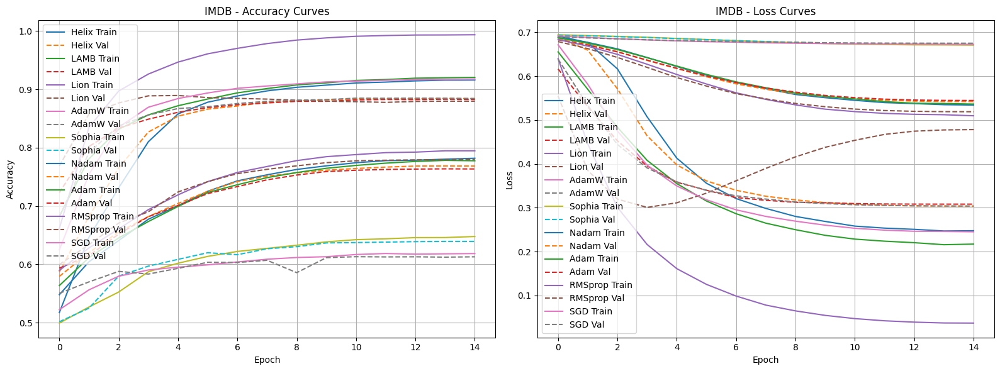

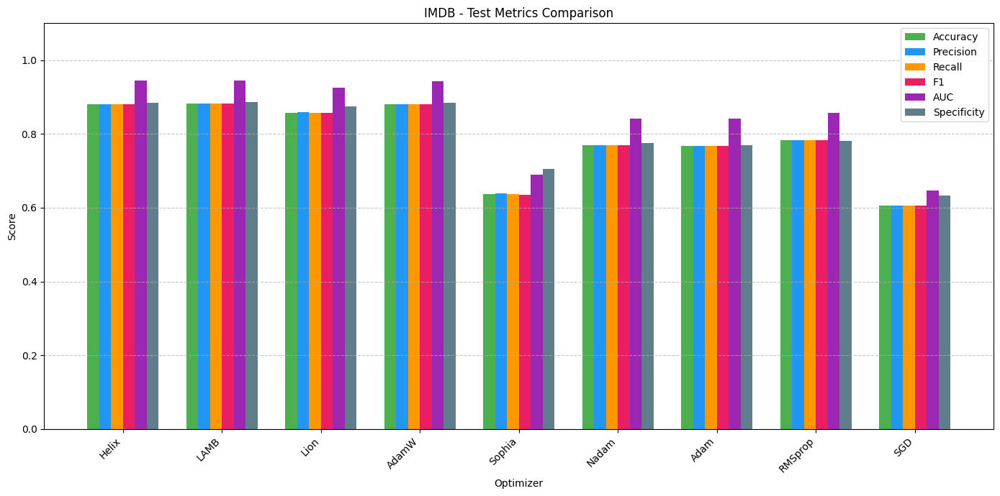

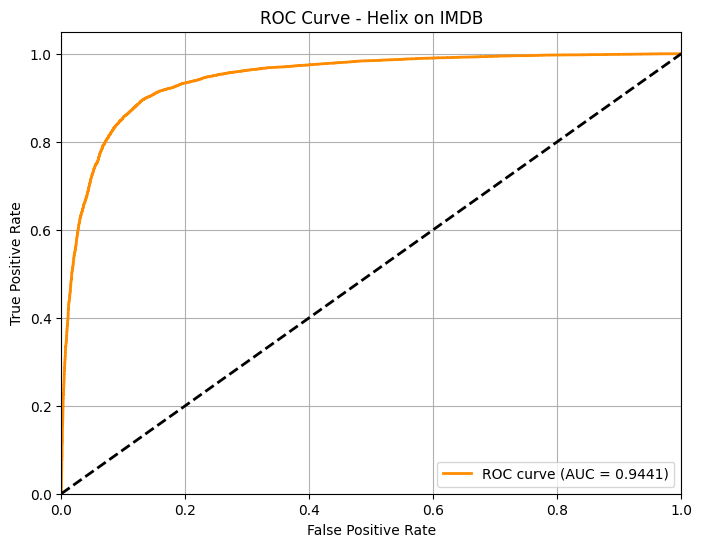

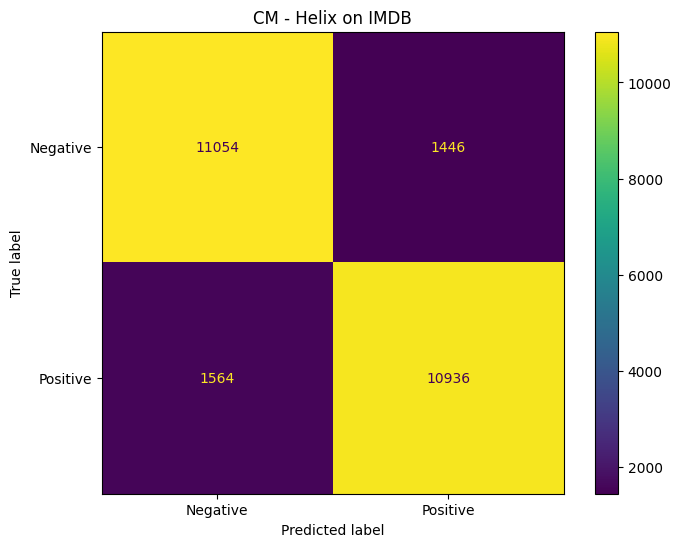

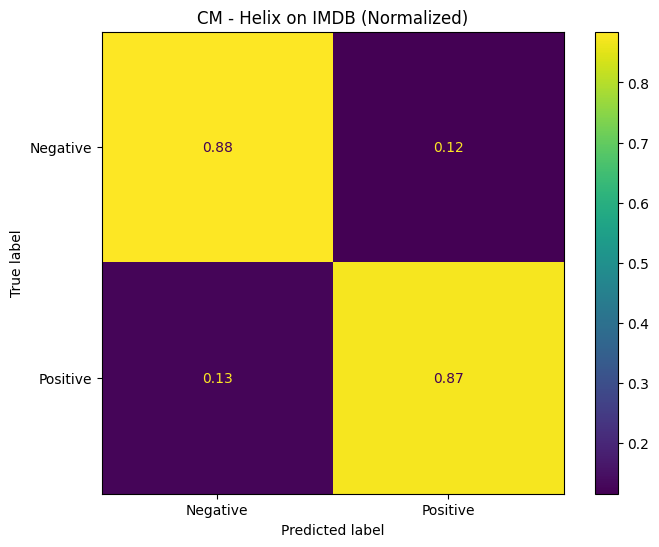

...

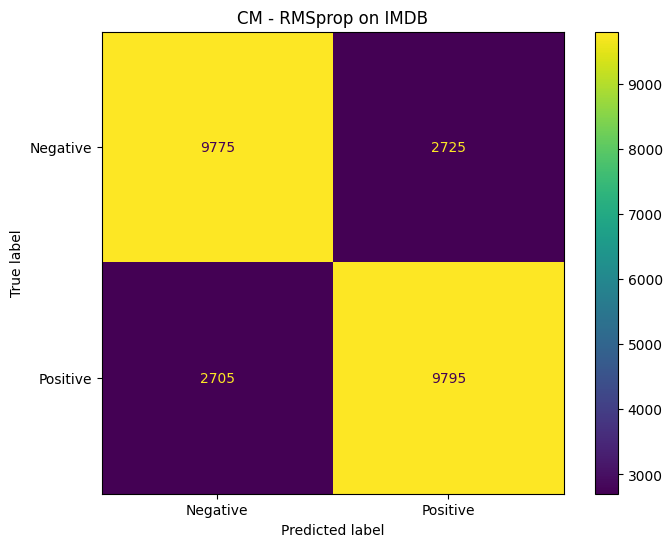

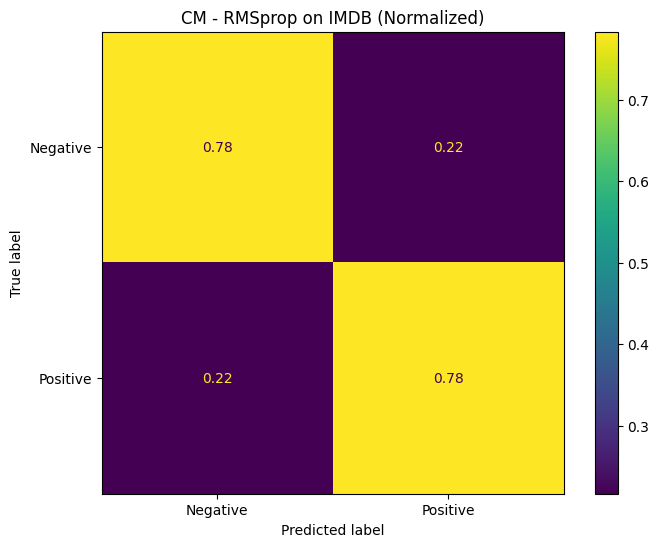

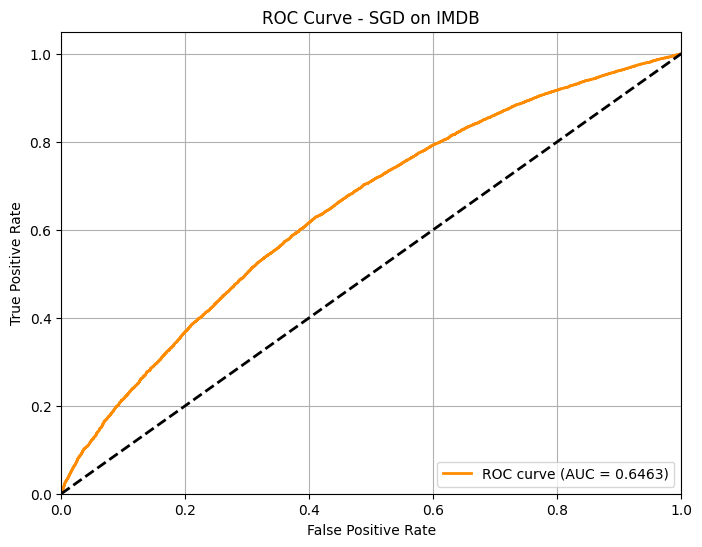

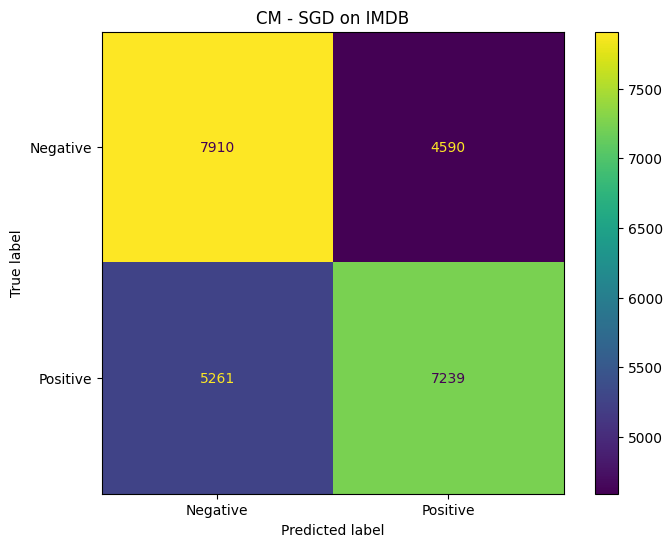

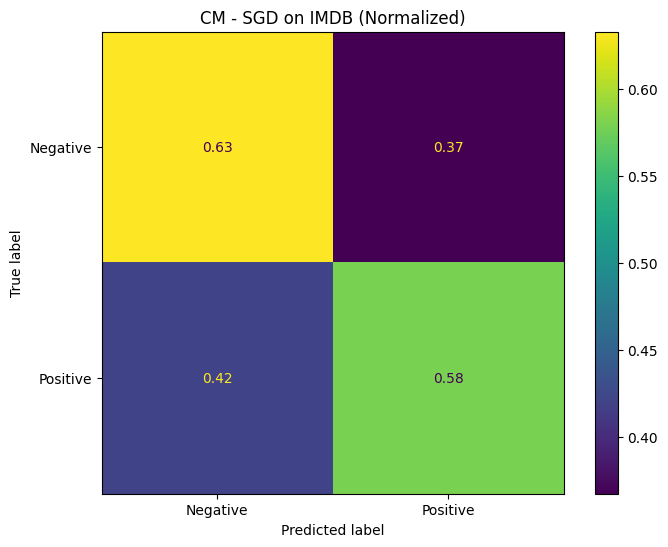


=== LaTeX Table for IMDB ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Helix & 0.3125 & 0.8796 & 0.8796 & 0.8796 & 0.8796 & 0.9441 & 0.8843 & 1.29 \\
LAMB & 0.3107 & 0.8825 & 0.8825 & 0.8825 & 0.8825 & 0.9456 & 0.8857 & 1.32 \\
Lion & 0.5701 & 0.8580 & 0.8584 & 0.8580 & 0.8579 & 0.9255 & 0.8754 & 1.04 \\
AdamW & 0.3136 & 0.8795 & 0.8796 & 0.8795 & 0.8795 & 0.9436 & 0.8850 & 1.08 \\
Sophia & 0.6731 & 0.6361 & 0.6387 & 0.6361 & 0.6344 & 0.6900 & 0.7043 & 1.08 \\
Nadam & 0.5415 & 0.7703 & 0.7703 & 0.7703 & 0.7703 & 0.8425 & 0.7744 & 1.09 \\
Adam & 0.5430 & 0.7666 & 0.7666 & 0.7666 & 0.7666 & 0.8406 & 0.7690 & 1.09 \\
RMSprop & 0.5177 & 0.7828 & 0.7828 & 0.7828 & 0.7828 & 0.8573 & 0.7820 & 1.04 \\
SGD & 0.6752 & 0.6060 & 0.6063 & 0.6060 & 0.6057 & 0.6463 & 0.6328 & 0.99 \\
\bottomrule
\end{tabular}
\caption{Performance Metrics for IMDB}
\label{tab:imdb_perf

In [ ]:
import os
import random
import time
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torch.utils.data import DataLoader, random_split, Dataset
from torch.nn.utils.rnn import pad_sequence
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle
from datasets import load_dataset
from collections import Counter
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt_tab')

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()
nltk.download('punkt', quiet=True)


# Global settings
NUM_EPOCHS =15 # Fewer epochs for this larger dataset
RESULTS_DIR = "results_imdb"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Apollo Optimizer
# ---------------------------
import torch
import torch.optim as optim
import torch.nn.functional as F

# ---------------------------
# Helix Optimizer
# ---------------------------
class Helix(Optimizer):
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), beta_s=0.9,
                 eps=1e-8, weight_decay=1e-2, agc=False,
                 phi_init=0.05, phi_final=0.4, phi_warmup=10000,
                 warmup_steps=1000, use_trust_ratio=False,
                 kappa=1.0, agc_clip=0.05):
        defaults = dict(lr=lr, betas=betas, beta_s=beta_s, eps=eps,
                        weight_decay=weight_decay, agc=agc,
                        phi_init=phi_init, phi_final=phi_final,
                        phi_warmup=phi_warmup, warmup_steps=warmup_steps,
                        use_trust_ratio=use_trust_ratio, kappa=kappa,
                        agc_clip=agc_clip)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr = group['lr']
            beta1, beta2 = group['betas']
            beta_s = group['beta_s']
            eps = group['eps']
            wd = group['weight_decay']
            phi_init = group['phi_init']
            phi_final = group['phi_final']
            phi_warmup = group['phi_warmup']
            warmup_steps = group['warmup_steps']
            use_trust = group['use_trust_ratio']
            kappa = group['kappa']
            agc_clip = group['agc_clip']
            use_agc = group['agc']

            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad
                if grad.is_sparse:
                    raise RuntimeError("Helix does not support sparse gradients")

                is_weight_like = (p.ndim > 1) and (p.numel() >= SMALL_PARAM_THRESHOLD)

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['b'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['s'] = torch.zeros_like(p, memory_format=torch.preserve_format)

                state['step'] += 1
                step = state['step']

                if (use_agc or use_trust) and is_weight_like:
                    param_norm = torch.linalg.vector_norm(p).clamp(min=eps)
                else:
                    param_norm = None

                if use_agc and is_weight_like:
                    grad_norm = torch.linalg.vector_norm(grad)
                    max_norm = agc_clip * param_norm
                    if grad_norm > max_norm:
                        grad.mul_(max_norm / (grad_norm + 1e-6))

                m = state['m']
                b = state['b']
                s = state['s']

                m.mul_(beta1).add_(grad, alpha=1.0 - beta1)
                diff = grad - m
                b.mul_(beta2).addcmul_(diff, diff, value=1.0 - beta2)

                bias_correction1 = 1.0 - beta1 ** step
                bias_correction2 = 1.0 - beta2 ** step
                m_hat = m / (bias_correction1 + 1e-16)
                b_hat = b / (bias_correction2 + 1e-16)
                d = b_hat.sqrt().add_(eps)

                s.mul_(beta_s).add_(m_hat.sign(), alpha=1.0 - beta_s)

                if step <= phi_warmup:
                    phi = phi_init + (phi_final - phi_init) * (step / max(1, phi_warmup))
                else:
                    phi = phi_final

                u_adapt = m_hat / d
                u_sign = s.clamp(-1.0, 1.0)
                delta = -((1.0 - phi) * u_adapt + phi * (kappa * u_sign))

                lr_t = lr * (step / max(1, warmup_steps)) if step <= warmup_steps else lr

                if use_trust and is_weight_like:
                    delta_norm = torch.linalg.vector_norm(delta)
                    if delta_norm > 0:
                        trust = (param_norm / (delta_norm + 1e-6)).clamp(0.01, 10.0)
                        delta.mul_(trust)

                p.add_(delta, alpha=lr_t)

                if wd != 0:
                    p.mul_(1.0 - lr_t * wd)

        return loss



class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for IMDB
# ---------------------------
class TextClassificationModel(nn.Module):
    """A simple text classification model with an embedding layer."""
    def __init__(self, vocab_size, embed_dim=128, num_class=2):
        super(TextClassificationModel, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=1)
        self.fc = nn.Linear(embed_dim, num_class)

    def forward(self, text):
        embedded = self.embedding(text)
        # Use mean pooling over the sequence dimension
        pooled = embedded.mean(1)
        return self.fc(pooled)

class IMDBDataset(Dataset):
    def __init__(self, texts, labels):
        self.texts = texts
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.texts[idx], self.labels[idx]

def get_imdb_loaders(batch_size=64):
    """Loads and preprocesses the IMDB data, returning DataLoaders."""
    print("Loading IMDB dataset...")
    dataset = load_dataset("imdb")

    print("Building vocabulary...")
    # Build vocab from the full training set
    counter = Counter()
    for item in dataset['train']:
        counter.update(word_tokenize(item['text'].lower()))

    vocab = {'<unk>': 0, '<pad>': 1}
    for i, (word, _) in enumerate(counter.most_common(10000 - 2), 2):
        vocab[word] = i

    def text_pipeline(text):
        return [vocab.get(token, vocab['<unk>']) for token in word_tokenize(text.lower())]

    def process_data(split):
        texts = [torch.tensor(text_pipeline(item['text']), dtype=torch.long) for item in split]
        labels = [item['label'] for item in split]
        return texts, labels

    train_texts, train_labels = process_data(dataset['train'])
    test_texts, test_labels = process_data(dataset['test'])

    # Create a validation set from the training set
    train_size = int(0.8 * len(train_labels))
    val_size = len(train_labels) - train_size
    train_indices, val_indices = random_split(range(len(train_labels)), [train_size, val_size])

    val_texts = [train_texts[i] for i in val_indices]
    val_labels = [train_labels[i] for i in val_indices]
    train_texts = [train_texts[i] for i in train_indices]
    train_labels = [train_labels[i] for i in train_indices]

    train_dataset = IMDBDataset(train_texts, train_labels)
    val_dataset = IMDBDataset(val_texts, val_labels)
    test_dataset = IMDBDataset(test_texts, test_labels)

    def collate_batch(batch):
        label_list, text_list = [], []
        for (_text, _label) in batch:
            label_list.append(_label)
            text_list.append(_text)
        return pad_sequence(text_list, batch_first=True, padding_value=1), torch.tensor(label_list, dtype=torch.long)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_batch)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)

    return train_loader, val_loader, test_loader, len(vocab)


# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="IMDB", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)

    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs[:, 1])

    cm = confusion_matrix(all_targets, all_preds)
    tn, fp, fn, tp = cm.ravel()
    final_metrics['test_specificity'] = tn / (tn + fp + 1e-8)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizer Registry # Manual configuration
# ---------------------------
optimizers = {    'Helix': lambda params: Helix(params,
                 lr=1e-3,
                 betas=(0.9, 0.99),
                 beta_s=0.99,
                 eps=1e-8,
                 weight_decay=1e-2,
                 agc=False,
                 phi_init=0.05,
                 phi_final=0.4,
                 phi_warmup=10000,
                 warmup_steps=1000,
                 use_trust_ratio=False,
                 kappa=1.0),

    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}

# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()


def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    colors = ['#4CAF50', '#2196F3', '#FF9800', '#E91E63', '#9C27B0', '#607D8B']

    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()


def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    fpr, tpr, _ = roc_curve(targets, probs[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right"); plt.grid(True)
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(8, 6))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_').replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    imdb_class_names = ['Negative', 'Positive']
    train_loader, val_loader, test_loader, vocab_size = get_imdb_loaders()

    results_imdb = {}
    for opt_name, opt_factory in optimizers.items():
        model_creator = lambda: TextClassificationModel(vocab_size)
        results_imdb[opt_name] = train_model(
            model_creator, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="IMDB", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for IMDB ---")
    plot_learning_curves(results_imdb, "IMDB", save_path=os.path.join(RESULTS_DIR, "imdb_learning_curves.png"))
    plot_test_metrics(results_imdb, "IMDB", save_path=os.path.join(RESULTS_DIR, "imdb_test_metrics.png"))

    for opt_name, result in results_imdb.items():
        plot_roc_curves(result, opt_name, imdb_class_names, "IMDB", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, imdb_class_names, "IMDB", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, imdb_class_names, "IMDB", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_imdb, "IMDB")
    print("\n=== LaTeX Table for IMDB ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "imdb_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "imdb_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_imdb.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_imdb"
# Define the name for the zip file
zip_filename = "/content/results_imdb.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_imdb.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 6-AG NEWS

Setting random seed for reproducibility...
Loading AG News dataset...
Building vocabulary...
Training Helix on AG News for 5 epochs on cuda...
Epoch 1/5 | Train Loss: 1.1682, Acc: 0.5766 | Val Loss: 0.6508, Acc: 0.8232 | Time: 5.07s
Epoch 2/5 | Train Loss: 0.4286, Acc: 0.8746 | Val Loss: 0.3354, Acc: 0.8948 | Time: 3.80s
Epoch 3/5 | Train Loss: 0.2926, Acc: 0.9103 | Val Loss: 0.2913, Acc: 0.9066 | Time: 3.77s
Epoch 4/5 | Train Loss: 0.2545, Acc: 0.9209 | Val Loss: 0.2776, Acc: 0.9100 | Time: 3.96s
Epoch 5/5 | Train Loss: 0.2401, Acc: 0.9255 | Val Loss: 0.2744, Acc: 0.9107 | Time: 3.69s

Final Test Results for Helix: Acc: 0.9113, F1: 0.9112, AUC: 0.9825

Training LAMB on AG News for 5 epochs on cuda...
Epoch 1/5 | Train Loss: 0.8171, Acc: 0.8222 | Val Loss: 0.4303, Acc: 0.8785 | Time: 3.39s
Epoch 2/5 | Train Loss: 0.3303, Acc: 0.9034 | Val Loss: 0.2909, Acc: 0.9064 | Time: 3.66s
Epoch 3/5 | Train Loss: 0.2476, Acc: 0.9225 | Val Loss: 0.2674, Acc: 0.9128 | Time: 3.34s
Epoch 4/5 | Train L

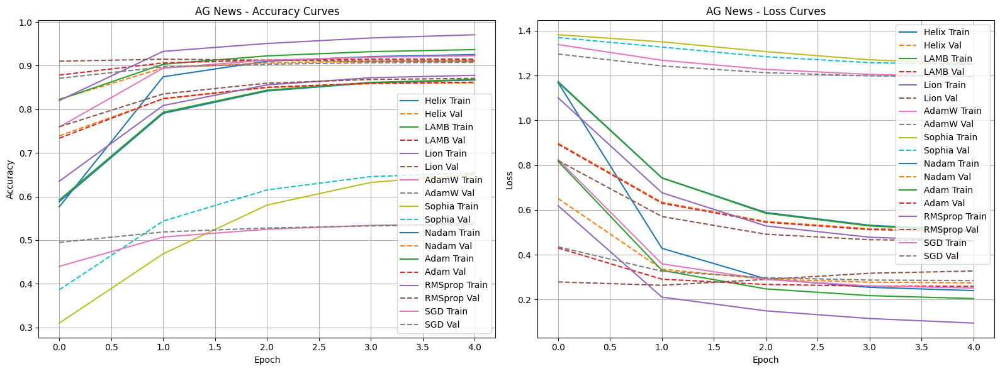

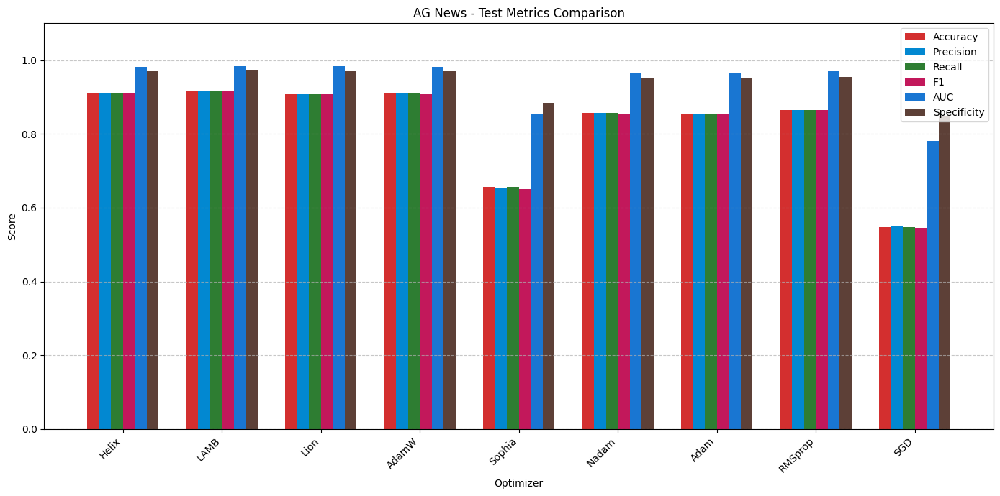

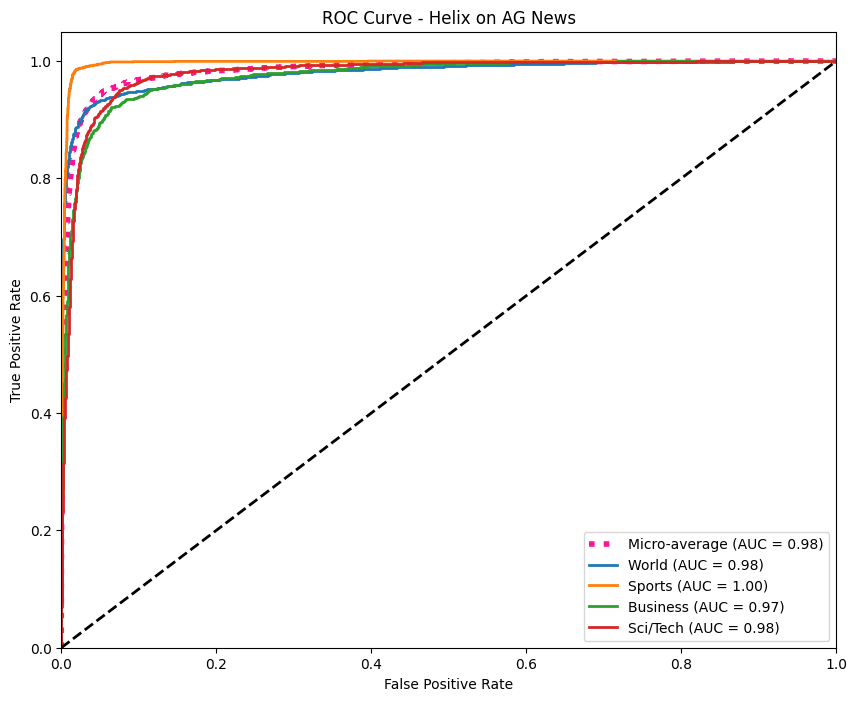

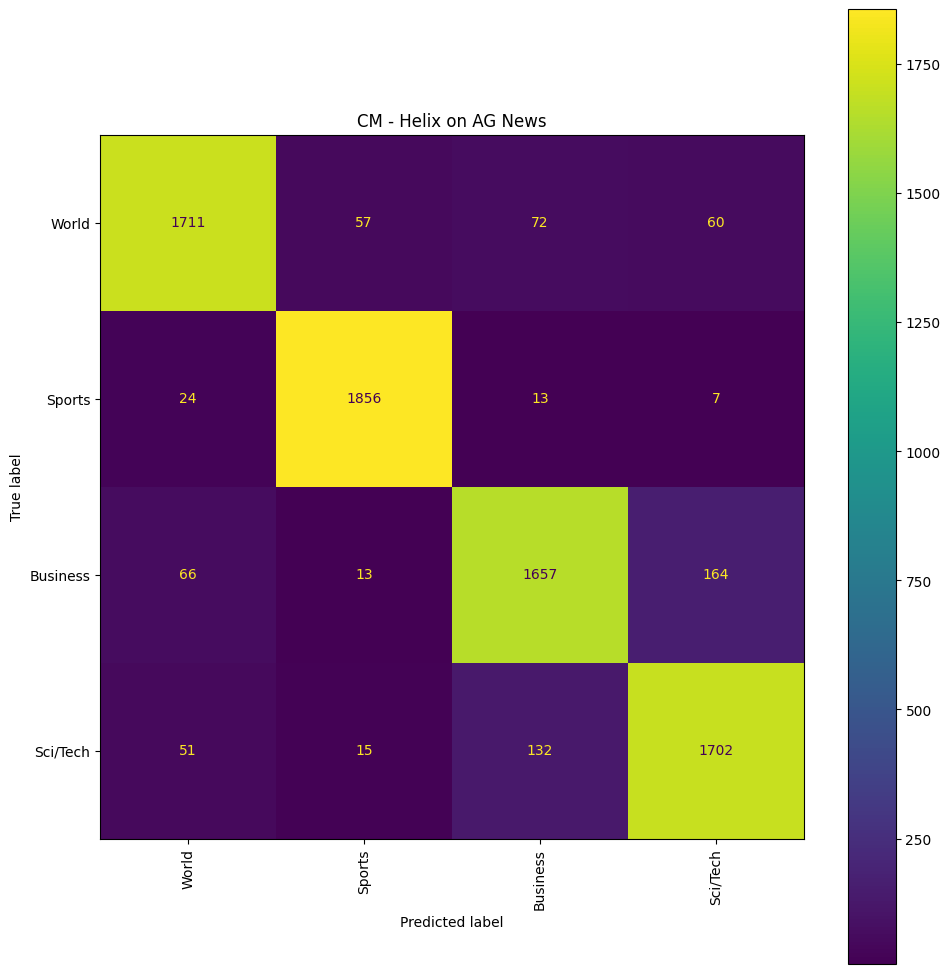

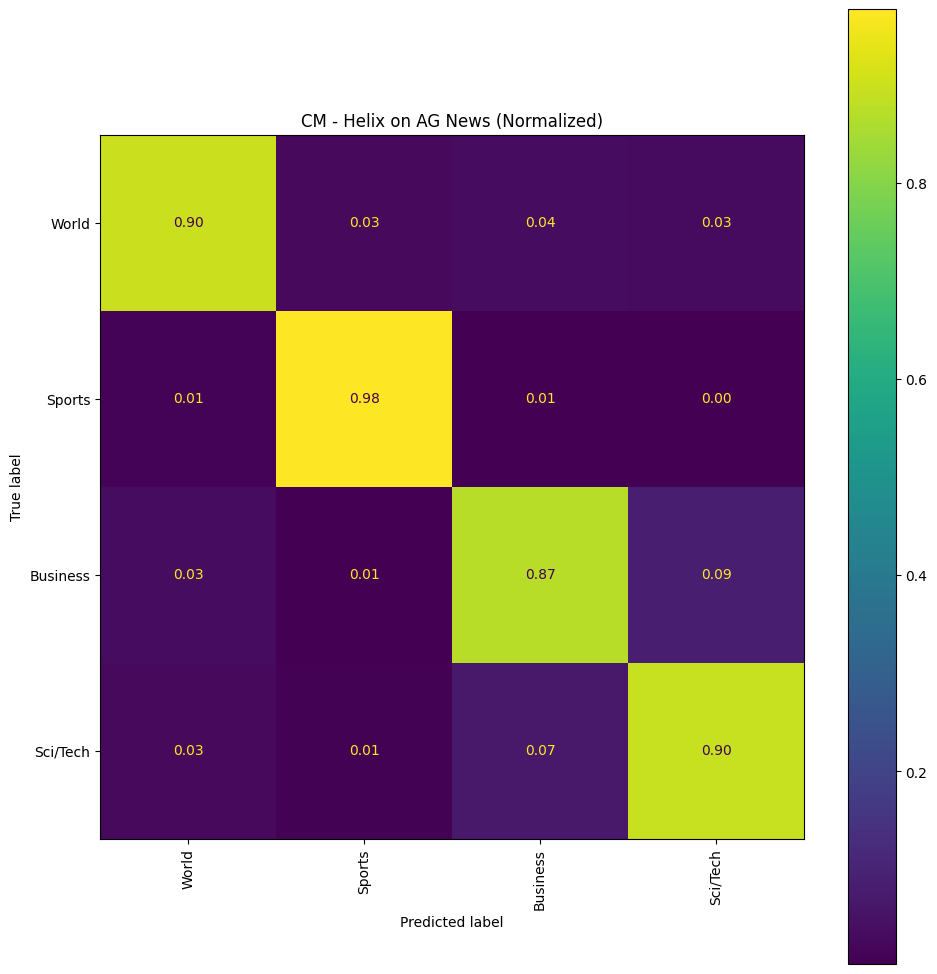

...

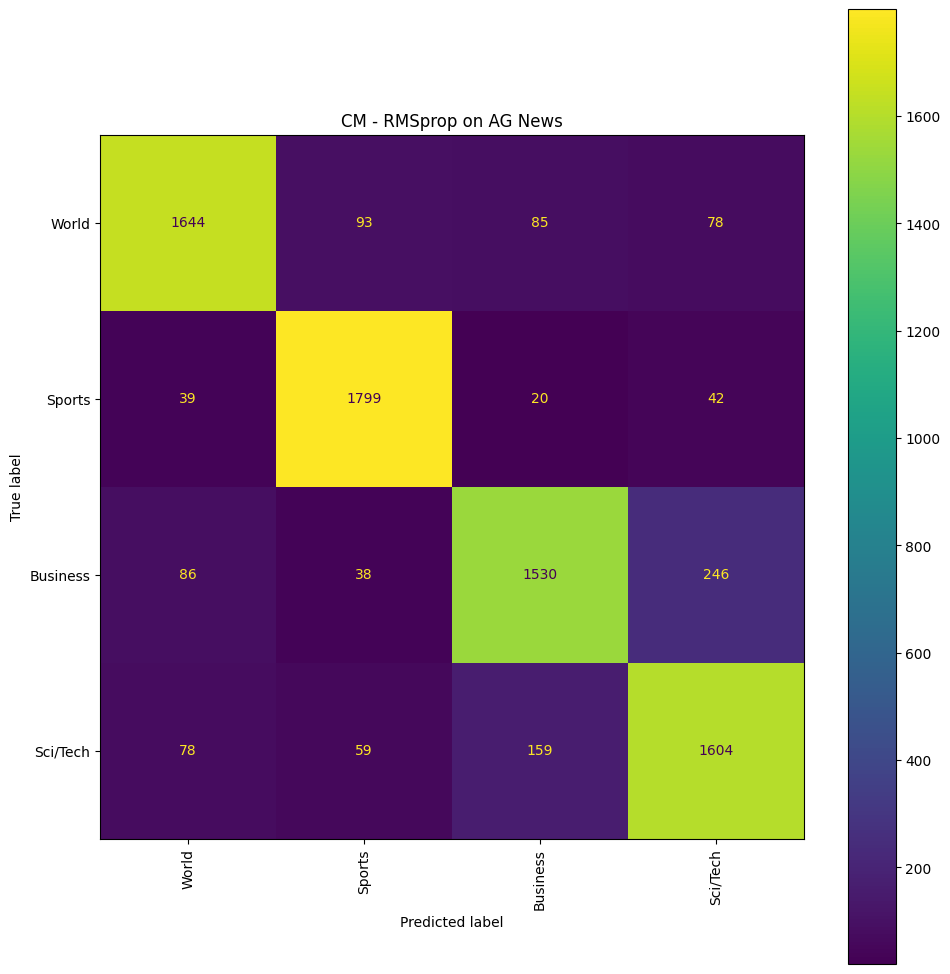

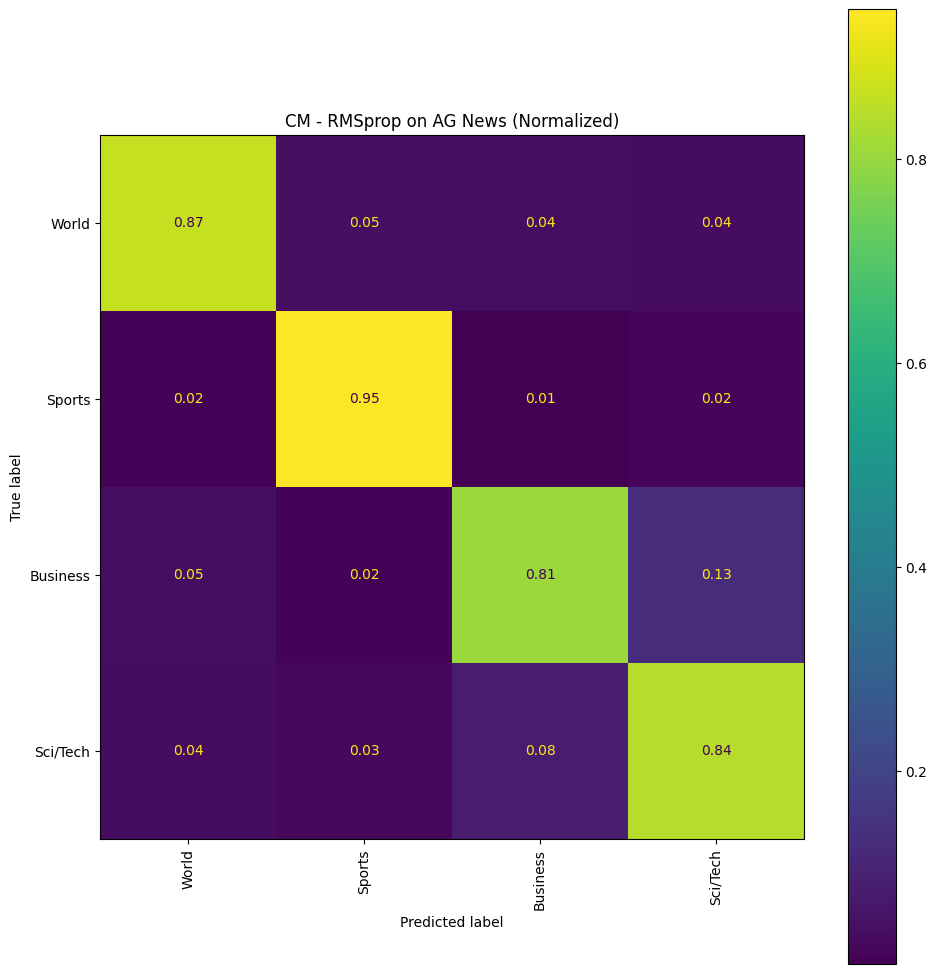

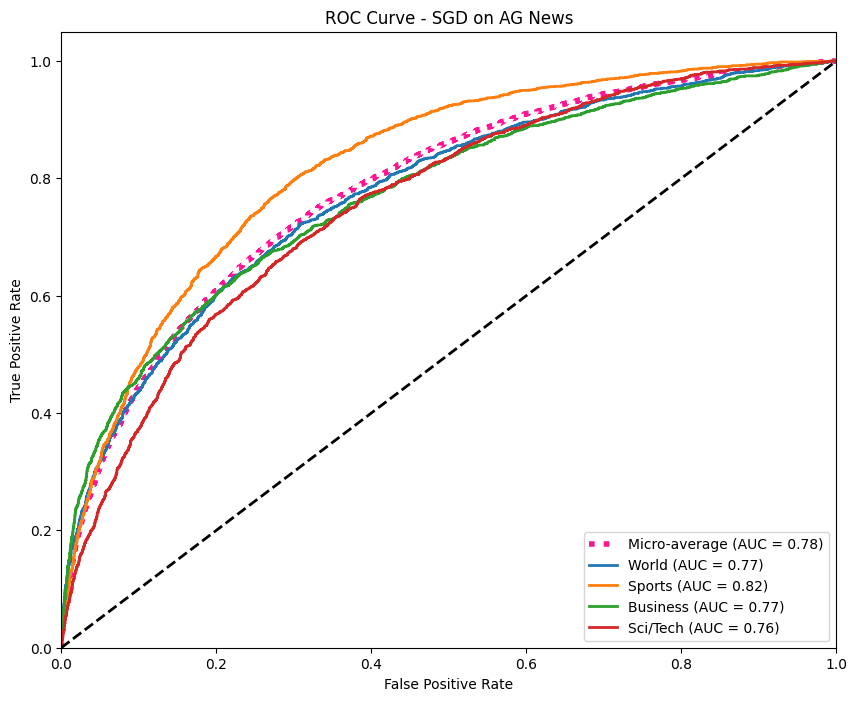

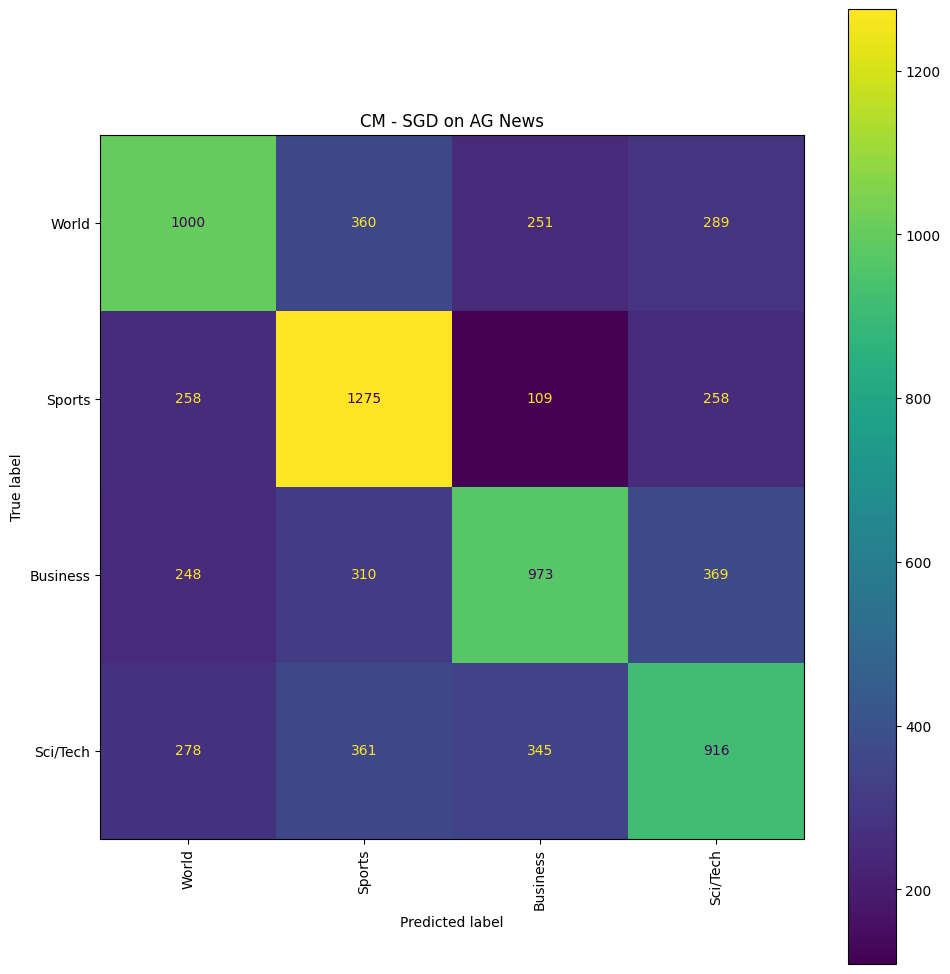

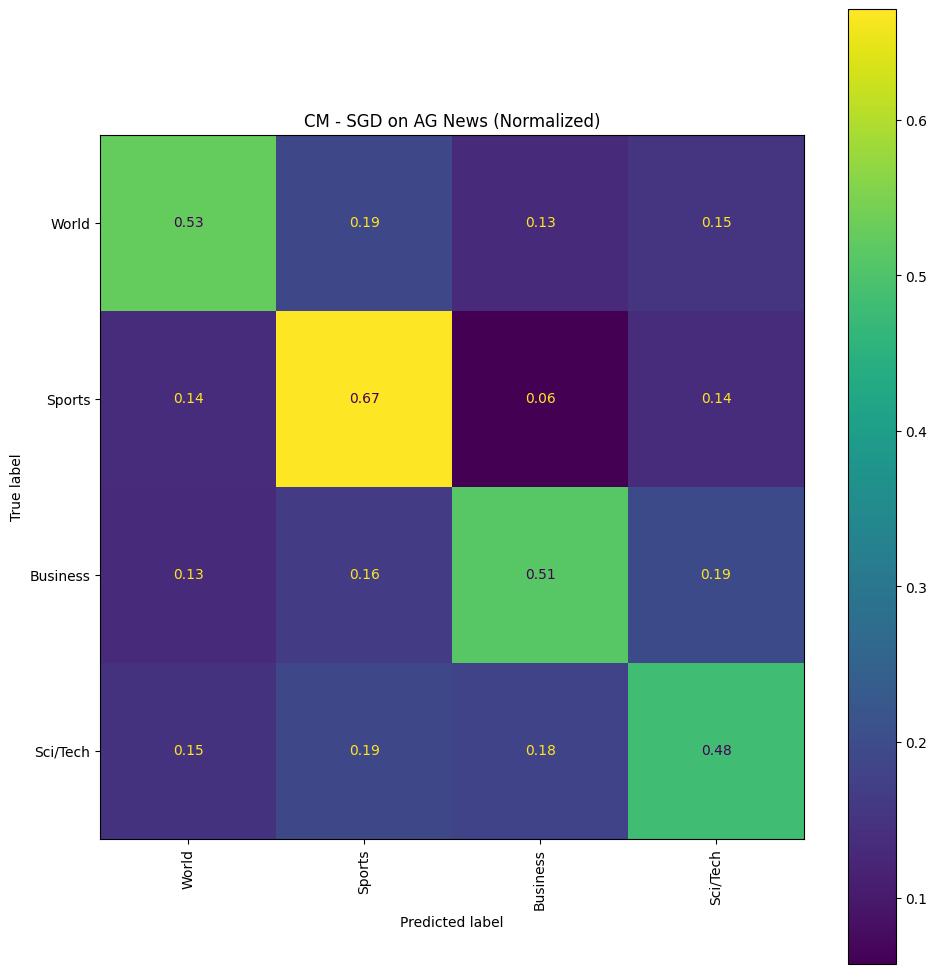


=== LaTeX Table for AG News ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Helix & 0.2828 & 0.9113 & 0.9112 & 0.9113 & 0.9112 & 0.9825 & 0.9704 & 4.08 \\
LAMB & 0.2692 & 0.9167 & 0.9166 & 0.9167 & 0.9166 & 0.9844 & 0.9722 & 3.42 \\
Lion & 0.3232 & 0.9087 & 0.9087 & 0.9087 & 0.9086 & 0.9843 & 0.9696 & 2.58 \\
AdamW & 0.2901 & 0.9088 & 0.9088 & 0.9088 & 0.9087 & 0.9819 & 0.9696 & 2.76 \\
Sophia & 1.2449 & 0.6557 & 0.6549 & 0.6557 & 0.6515 & 0.8550 & 0.8852 & 2.73 \\
Nadam & 0.5060 & 0.8563 & 0.8565 & 0.8563 & 0.8559 & 0.9664 & 0.9521 & 2.87 \\
Adam & 0.5043 & 0.8553 & 0.8554 & 0.8553 & 0.8549 & 0.9664 & 0.9518 & 2.74 \\
RMSprop & 0.4624 & 0.8654 & 0.8654 & 0.8654 & 0.8650 & 0.9696 & 0.9551 & 2.58 \\
SGD & 1.1856 & 0.5479 & 0.5483 & 0.5479 & 0.5460 & 0.7810 & 0.8493 & 2.35 \\
\bottomrule
\end{tabular}
\caption{Performance Metrics for AG News}
\label{tab:ag_

In [ ]:
import os
import random
import time
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split, Dataset
from torch.nn.utils.rnn import pad_sequence
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle
from datasets import load_dataset
from collections import Counter
from nltk.tokenize import word_tokenize
import nltk

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()
nltk.download('punkt', quiet=True)


# Global settings
NUM_EPOCHS = 5
RESULTS_DIR = "results_ag_news"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Optimizer Implementations
# ---------------------------



import torch
import torch.optim as optim
import torch.nn.functional as F

# ---------------------------
# Helix Optimizer
# ---------------------------
class Helix(Optimizer):
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), beta_s=0.9,
                 eps=1e-8, weight_decay=1e-2, agc=False,
                 phi_init=0.05, phi_final=0.4, phi_warmup=10000,
                 warmup_steps=1000, use_trust_ratio=False,
                 kappa=1.0, agc_clip=0.05):
        defaults = dict(lr=lr, betas=betas, beta_s=beta_s, eps=eps,
                        weight_decay=weight_decay, agc=agc,
                        phi_init=phi_init, phi_final=phi_final,
                        phi_warmup=phi_warmup, warmup_steps=warmup_steps,
                        use_trust_ratio=use_trust_ratio, kappa=kappa,
                        agc_clip=agc_clip)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr = group['lr']
            beta1, beta2 = group['betas']
            beta_s = group['beta_s']
            eps = group['eps']
            wd = group['weight_decay']
            phi_init = group['phi_init']
            phi_final = group['phi_final']
            phi_warmup = group['phi_warmup']
            warmup_steps = group['warmup_steps']
            use_trust = group['use_trust_ratio']
            kappa = group['kappa']
            agc_clip = group['agc_clip']
            use_agc = group['agc']

            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad
                if grad.is_sparse:
                    raise RuntimeError("Helix does not support sparse gradients")

                is_weight_like = (p.ndim > 1) and (p.numel() >= SMALL_PARAM_THRESHOLD)

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['b'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['s'] = torch.zeros_like(p, memory_format=torch.preserve_format)

                state['step'] += 1
                step = state['step']

                if (use_agc or use_trust) and is_weight_like:
                    param_norm = torch.linalg.vector_norm(p).clamp(min=eps)
                else:
                    param_norm = None

                if use_agc and is_weight_like:
                    grad_norm = torch.linalg.vector_norm(grad)
                    max_norm = agc_clip * param_norm
                    if grad_norm > max_norm:
                        grad.mul_(max_norm / (grad_norm + 1e-6))

                m = state['m']
                b = state['b']
                s = state['s']

                m.mul_(beta1).add_(grad, alpha=1.0 - beta1)
                diff = grad - m
                b.mul_(beta2).addcmul_(diff, diff, value=1.0 - beta2)

                bias_correction1 = 1.0 - beta1 ** step
                bias_correction2 = 1.0 - beta2 ** step
                m_hat = m / (bias_correction1 + 1e-16)
                b_hat = b / (bias_correction2 + 1e-16)
                d = b_hat.sqrt().add_(eps)

                s.mul_(beta_s).add_(m_hat.sign(), alpha=1.0 - beta_s)

                if step <= phi_warmup:
                    phi = phi_init + (phi_final - phi_init) * (step / max(1, phi_warmup))
                else:
                    phi = phi_final

                u_adapt = m_hat / d
                u_sign = s.clamp(-1.0, 1.0)
                delta = -((1.0 - phi) * u_adapt + phi * (kappa * u_sign))

                lr_t = lr * (step / max(1, warmup_steps)) if step <= warmup_steps else lr

                if use_trust and is_weight_like:
                    delta_norm = torch.linalg.vector_norm(delta)
                    if delta_norm > 0:
                        trust = (param_norm / (delta_norm + 1e-6)).clamp(0.01, 10.0)
                        delta.mul_(trust)

                p.add_(delta, alpha=lr_t)

                if wd != 0:
                    p.mul_(1.0 - lr_t * wd)

        return loss


class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for AG News
# ---------------------------
class TextClassificationModel(nn.Module):
    """A simple text classification model with an embedding layer."""
    def __init__(self, vocab_size, embed_dim=128, num_class=4):
        super(TextClassificationModel, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=1)
        self.fc = nn.Linear(embed_dim, num_class)

    def forward(self, text):
        embedded = self.embedding(text)
        pooled = embedded.mean(1)
        return self.fc(pooled)

class AGNewsDataset(Dataset):
    def __init__(self, texts, labels):
        self.texts = texts
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.texts[idx], self.labels[idx]

def get_ag_news_loaders(batch_size=128):
    """Loads and preprocesses the AG News data."""
    print("Loading AG News dataset...")
    dataset = load_dataset("ag_news")

    print("Building vocabulary...")
    train_val_data = dataset['train']
    counter = Counter()
    for item in train_val_data:
        counter.update(word_tokenize(item['text'].lower()))

    vocab = {'<unk>': 0, '<pad>': 1}
    for i, (word, _) in enumerate(counter.most_common(20000 - 2), 2):
        vocab[word] = i

    def text_pipeline(text):
        return [vocab.get(token, vocab['<unk>']) for token in word_tokenize(text.lower())]

    def process_data(split):
        texts = [torch.tensor(text_pipeline(item['text']), dtype=torch.long) for item in split]
        labels = [item['label'] for item in split]
        return texts, labels

    train_val_texts, train_val_labels = process_data(dataset['train'])
    test_texts, test_labels = process_data(dataset['test'])

    train_size = int(0.9 * len(train_val_labels))
    val_size = len(train_val_labels) - train_size
    train_indices, val_indices = random_split(range(len(train_val_labels)), [train_size, val_size])

    train_texts = [train_val_texts[i] for i in train_indices]
    train_labels = [train_val_labels[i] for i in train_indices]
    val_texts = [train_val_texts[i] for i in val_indices]
    val_labels = [train_val_labels[i] for i in val_indices]

    train_dataset = AGNewsDataset(train_texts, train_labels)
    val_dataset = AGNewsDataset(val_texts, val_labels)
    test_dataset = AGNewsDataset(test_texts, test_labels)

    def collate_batch(batch):
        label_list, text_list = [], []
        for (_text, _label) in batch:
            label_list.append(_label)
            text_list.append(_text)
        return pad_sequence(text_list, batch_first=True, padding_value=1), torch.tensor(label_list, dtype=torch.long)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_batch)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)

    return train_loader, val_loader, test_loader, len(vocab), len(dataset['train'].features['label'].names)


# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=5, dataset_name="AG News", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizer Registry # Manual configuration
# ---------------------------
optimizers = {    'Helix': lambda params: Helix(params,
                 lr=1e-3,
                 betas=(0.9, 0.99),
                 beta_s=0.99,
                 eps=1e-8,
                 weight_decay=1e-2,
                 agc=False,
                 phi_init=0.05,
                 phi_final=0.4,
                 phi_warmup=10000,
                 warmup_steps=1000,
                 use_trust_ratio=False,
                 kappa=1.0),

    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}


# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    # Beautiful color palette (only change)
    colors = ['#D32F2F', '#0288D1', '#2E7D32', '#C2185B', '#1976D2', '#5D4037']

    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()

def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd', xticks_rotation='vertical')
    plt.title(title)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_').replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    train_loader, val_loader, test_loader, vocab_size, num_classes = get_ag_news_loaders()
    class_names = ['World', 'Sports', 'Business', 'Sci/Tech']

    results_ag_news = {}
    for opt_name, opt_factory in optimizers.items():
        model_creator = lambda: TextClassificationModel(vocab_size, 128, num_classes)
        results_ag_news[opt_name] = train_model(
            model_creator, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="AG News", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for AG News ---")
    plot_learning_curves(results_ag_news, "AG News", save_path=os.path.join(RESULTS_DIR, "ag_news_learning_curves.png"))
    plot_test_metrics(results_ag_news, "AG News", save_path=os.path.join(RESULTS_DIR, "ag_news_test_metrics.png"))

    for opt_name, result in results_ag_news.items():
        plot_roc_curves(result, opt_name, class_names, "AG News", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, class_names, "AG News", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, class_names, "AG News", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_ag_news, "AG News")
    print("\n=== LaTeX Table for AG News ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "ag_news_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "ag_news_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_ag_news.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_ag_news"
# Define the name for the zip file
zip_filename = "/content/results_ag_news.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_ag_news.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# !rm -rf results_ag_news

# 7- SVHN

In [1]:
import os
import random
import time
from collections import Counter
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()

# Global settings
NUM_EPOCHS = 10
RESULTS_DIR = "results_svhn"

# Create results directory (FIXED: was missing this)
os.makedirs(RESULTS_DIR, exist_ok=True)

SMALL_PARAM_THRESHOLD = 1024  # skip AGC/trust for tiny tensors to save norms


# ---------------------------
# Optimizer Implementations
# ---------------------------

# ---------------------------
# Helix Optimizer
# ---------------------------
class Helix(Optimizer):
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), beta_s=0.9,
                 eps=1e-8, weight_decay=1e-2, agc=False,
                 phi_init=0.05, phi_final=0.4, phi_warmup=10000,
                 warmup_steps=1000, use_trust_ratio=False,
                 kappa=1.0, agc_clip=0.05):
        defaults = dict(lr=lr, betas=betas, beta_s=beta_s, eps=eps,
                        weight_decay=weight_decay, agc=agc,
                        phi_init=phi_init, phi_final=phi_final,
                        phi_warmup=phi_warmup, warmup_steps=warmup_steps,
                        use_trust_ratio=use_trust_ratio, kappa=kappa,
                        agc_clip=agc_clip)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr = group['lr']
            beta1, beta2 = group['betas']
            beta_s = group['beta_s']
            eps = group['eps']
            wd = group['weight_decay']
            phi_init = group['phi_init']
            phi_final = group['phi_final']
            phi_warmup = group['phi_warmup']
            warmup_steps = group['warmup_steps']
            use_trust = group['use_trust_ratio']
            kappa = group['kappa']
            agc_clip = group['agc_clip']
            use_agc = group['agc']

            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad
                if grad.is_sparse:
                    raise RuntimeError("Helix does not support sparse gradients")

                is_weight_like = (p.ndim > 1) and (p.numel() >= SMALL_PARAM_THRESHOLD)

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['b'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['s'] = torch.zeros_like(p, memory_format=torch.preserve_format)

                state['step'] += 1
                step = state['step']

                if (use_agc or use_trust) and is_weight_like:
                    param_norm = torch.linalg.vector_norm(p).clamp(min=eps)
                else:
                    param_norm = None

                if use_agc and is_weight_like:
                    grad_norm = torch.linalg.vector_norm(grad)
                    max_norm = agc_clip * param_norm
                    if grad_norm > max_norm:
                        grad.mul_(max_norm / (grad_norm + 1e-6))

                m = state['m']
                b = state['b']
                s = state['s']

                m.mul_(beta1).add_(grad, alpha=1.0 - beta1)
                diff = grad - m
                b.mul_(beta2).addcmul_(diff, diff, value=1.0 - beta2)

                bias_correction1 = 1.0 - beta1 ** step
                bias_correction2 = 1.0 - beta2 ** step
                m_hat = m / (bias_correction1 + 1e-16)
                b_hat = b / (bias_correction2 + 1e-16)
                d = b_hat.sqrt().add_(eps)

                s.mul_(beta_s).add_(m_hat.sign(), alpha=1.0 - beta_s)

                if step <= phi_warmup:
                    phi = phi_init + (phi_final - phi_init) * (step / max(1, phi_warmup))
                else:
                    phi = phi_final

                u_adapt = m_hat / d
                u_sign = s.clamp(-1.0, 1.0)
                delta = -((1.0 - phi) * u_adapt + phi * (kappa * u_sign))

                lr_t = lr * (step / max(1, warmup_steps)) if step <= warmup_steps else lr

                if use_trust and is_weight_like:
                    delta_norm = torch.linalg.vector_norm(delta)
                    if delta_norm > 0:
                        trust = (param_norm / (delta_norm + 1e-6)).clamp(0.01, 10.0)
                        delta.mul_(trust)

                p.add_(delta, alpha=lr_t)

                if wd != 0:
                    p.mul_(1.0 - lr_t * wd)

        return loss


class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss


class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss


class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss


# ---------------------------
# Model and Data for SVHN
# ---------------------------
def get_resnet18_svhn():
    """Returns a ResNet-18 model adapted for SVHN."""
    model = models.resnet18(weights=None, num_classes=10)
    # Adapt for 32x32 images
    model.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
    model.maxpool = nn.Identity()
    return model


def get_svhn_loaders(batch_size=128, data_root="./data"):
    """Creates and returns SVHN DataLoaders."""
    # Mean and std for SVHN dataset
    normalize_transform = transforms.Normalize((0.4377, 0.4438, 0.4728), (0.1980, 0.2010, 0.1970))

    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        normalize_transform,
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        normalize_transform,
    ])

    train_dataset = datasets.SVHN(root=data_root, split="train", download=True, transform=transform_train)
    test_dataset = datasets.SVHN(root=data_root, split="test", download=True, transform=transform_test)

    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    return train_loader, val_loader, test_loader


# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="SVHN", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}


# ---------------------------
# Optimizer Registry
# ---------------------------
optimizers = {
    'Helix': lambda params: Helix(params,
                 lr=1e-3,
                 betas=(0.9, 0.99),
                 beta_s=0.99,
                 eps=1e-8,
                 weight_decay=1e-2,
                 agc=False,
                 phi_init=0.05,
                 phi_final=0.4,
                 phi_warmup=10000,
                 warmup_steps=1000,
                 use_trust_ratio=False,
                 kappa=1.0),

    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}


# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
        plt.close(fig)
    else:
        plt.show()


def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    colors = ['#66BB6A', '#42A5F5', '#FFA737', '#EF5350', '#B39DDB', '#26A69A']
    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
        plt.close()
    else:
        plt.show()


def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'Class {class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path:
        plt.savefig(save_path)
        plt.close()
    else:
        plt.show()


def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='cool', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path:
        plt.savefig(save_path)
        plt.close(fig)
    else:
        plt.show()


def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer


# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    svhn_class_names = [str(i) for i in range(10)]
    train_loader, val_loader, test_loader = get_svhn_loaders()

    results_svhn = {}
    for opt_name, opt_factory in optimizers.items():
        results_svhn[opt_name] = train_model(
            get_resnet18_svhn, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="SVHN", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for SVHN ---")
    plot_learning_curves(results_svhn, "SVHN", save_path=os.path.join(RESULTS_DIR, "svhn_learning_curves.png"))
    plot_test_metrics(results_svhn, "SVHN", save_path=os.path.join(RESULTS_DIR, "svhn_test_metrics.png"))

    for opt_name, result in results_svhn.items():
        plot_roc_curves(result, opt_name, svhn_class_names, "SVHN", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, svhn_class_names, "SVHN", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, svhn_class_names, "SVHN", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_svhn, "SVHN")
    print("\n=== LaTeX Table for SVHN ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "svhn_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file
    txt_path = os.path.join(RESULTS_DIR, "svhn_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_svhn.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
             )
    print(f"Summary text file saved to: {txt_path}")

    print("\n--- Script Finished ---")

Setting random seed for reproducibility...


100%|██████████| 182M/182M [00:18<00:00, 9.99MB/s]
100%|██████████| 64.3M/64.3M [00:17<00:00, 3.69MB/s]


Training Helix on SVHN for 10 epochs on cuda...
Epoch 1/10 | Train Loss: 1.3050, Acc: 0.5456 | Val Loss: 0.6999, Acc: 0.7862 | Time: 62.18s
Epoch 2/10 | Train Loss: 0.4522, Acc: 0.8587 | Val Loss: 0.4095, Acc: 0.8707 | Time: 63.15s
Epoch 3/10 | Train Loss: 0.3552, Acc: 0.8916 | Val Loss: 0.3905, Acc: 0.8832 | Time: 63.33s
Epoch 4/10 | Train Loss: 0.2926, Acc: 0.9118 | Val Loss: 0.2695, Acc: 0.9180 | Time: 63.50s
Epoch 5/10 | Train Loss: 0.2490, Acc: 0.9270 | Val Loss: 0.2528, Acc: 0.9271 | Time: 63.87s
Epoch 6/10 | Train Loss: 0.2180, Acc: 0.9370 | Val Loss: 0.2311, Acc: 0.9333 | Time: 64.27s
Epoch 7/10 | Train Loss: 0.1854, Acc: 0.9465 | Val Loss: 0.2213, Acc: 0.9358 | Time: 63.44s
Epoch 8/10 | Train Loss: 0.1644, Acc: 0.9543 | Val Loss: 0.1911, Acc: 0.9454 | Time: 63.68s
Epoch 9/10 | Train Loss: 0.1416, Acc: 0.9617 | Val Loss: 0.1894, Acc: 0.9469 | Time: 63.63s
Epoch 10/10 | Train Loss: 0.1279, Acc: 0.9655 | Val Loss: 0.1821, Acc: 0.9492 | Time: 63.54s

Final Test Results for Helix: 

In [3]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_svhn"
# Define the name for the zip file
zip_filename = "/content/results_svhn.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_svhn.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# !rm -rf results_svhn